In [1]:
%matplotlib inline

In [2]:
from datetime import datetime
import os
from os.path import dirname, abspath, join
from os import getcwd
import sys

In [3]:
import random
import string
import pandas as pd
import numpy as np

In [4]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

In [5]:
import torch
import socket
from IPython.display import clear_output

In [6]:
# seed_arg = int(sys.argv[1])
# print ("\n\nSeed ARG: ",seed_arg)
seed_arg = 1

In [7]:
seedlist = np.array([161, 314, 228, 271828, 230, 4271031, 5526538, 6610165, 9849252, 34534, 73422, 8765])
seed = seedlist[seed_arg]
random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)

In [8]:
NAME       = 'F_aomori'
MODELNAME  = NAME + '_' + str(seed) + '.pt'
print("\nMODEL : ", NAME)
print("SEED  : ",seed_arg)
print("HOST  : ",socket.gethostname())
print("START : ",datetime.now())


MODEL :  F_aomori
SEED  :  1
HOST  :  e5155838fc98
START :  2019-03-18 00:04:22.662664


In [9]:
class ENO(object):
    
    #no. of forecast types is 6 ranging from 0 to 5
  
    def __init__(self, location='tokyo', year=2010, shuffle=False, day_balance=False):
        self.location = location
        self.year = year
        self.day = None
        self.hr = None
        
        self.shuffle = shuffle
        self.day_balance = day_balance

        self.TIME_STEPS = None #no. of time steps in one episode
        self.NO_OF_DAYS = None #no. of days in one year
        
        self.NO_OF_DAYTYPE = 10 #no. of daytypes
        self.daycounter = 0 #to count number of days that have been passed
        
        self.sradiation = None #matrix with GSR for the entire year
        self.senergy = None #matrix with harvested energy data for the entire year
        self.fforecast = None #array with forecast values for each day
        

        self.henergy = None #harvested energy variable
        self.fcast = None #forecast variable
        self.sorted_days = [] #days sorted according to day type
        
        self.SMAX = 1000 # 1 Watt Solar Panel

    
    #function to get the solar data for the given location and year and prep it
    def get_data(self):
        #solar_data/CSV files contain the values of GSR (Global Solar Radiation in MegaJoules per meters squared per hour)
        #weather_data/CSV files contain the weather summary from 06:00 to 18:00 and 18:00 to 06:00+1
        location = self.location
        year = self.year

        THIS_DIR = getcwd()
        SDATA_DIR = abspath(join(THIS_DIR, 'solar_data'))  #abspath(join(THIS_DIR, '../../..', 'data'))
        
        sfile = SDATA_DIR + '/' + location +'/' + str(year) + '.csv'
        
        #skiprows=4 to remove unnecessary title texts
        #usecols=4 to read only the Global Solar Radiation (GSR) values
        solar_radiation = pd.read_csv(sfile, skiprows=4, encoding='shift_jisx0213', usecols=[4])
      
        #convert dataframe to numpy array
        solar_radiation = solar_radiation.values

        #convert missing data in CSV files to zero
        solar_radiation[np.isnan(solar_radiation)] = 0

        #reshape solar_radiation into no_of_daysx24 array
        solar_radiation = solar_radiation.reshape(-1,24)

        if(self.shuffle): #if class instatiation calls for shuffling the day order. Required when learning
            np.random.shuffle(solar_radiation) 
        self.sradiation = solar_radiation
        
        #GSR values (in MJ/sq.mts per hour) need to be expressed in mW
        # Conversion is accomplished by 
        # solar_energy = GSR(in MJ/m2/hr) * 1e6 * size of solar cell * efficiency of solar cell /(60x60) *1000 (to express in mW)
        # the factor of 2 in the end is assuming two solar cells
        self.senergy = 2*self.sradiation * 1e6 * (55e-3 * 70e-3) * 0.15 * 1000/(60*60)

        return 0
    
    #function to map total day radiation into type of day ranging from 0 to 5
    #the classification into day types is quite arbitrary. There is no solid logic behind this type of classification.
    
    def get_day_state(self,tot_day_radiation):
        bin_edges = np.array([0, 3.5, 6.5, 9.0, 12.5, 15.5, 18.5, 22.0, 25, 28])
        for k in np.arange(1,bin_edges.size):
            if (bin_edges[k-1] < tot_day_radiation <= bin_edges[k]):
                day_state = k -1
            else:
                day_state = bin_edges.size - 1
        return int(day_state)
    
    def get_forecast(self):
        #create a perfect forecaster.
        tot_day_radiation = np.sum(self.sradiation, axis=1) #contains total solar radiation for each day
        get_day_state = np.vectorize(self.get_day_state)
        self.fforecast = get_day_state(tot_day_radiation)
        
        #sort days depending on the type of day and shuffle them; maybe required when learning
        for fcast in range(0,6):
            fcast_days = ([i for i,x in enumerate(self.fforecast) if x == fcast])
            np.random.shuffle(fcast_days)
            self.sorted_days.append(fcast_days)
        return 0
    
    def reset(self,day=0): #it is possible to reset to the beginning of a certain day
        
        self.get_data() #first get data for the given year
        self.get_forecast() #calculate the forecast
        
        self.TIME_STEPS = self.senergy.shape[1]
        self.NO_OF_DAYS = self.senergy.shape[0]
        
        self.day = day
        self.hr = 0
        
        self.henergy = self.senergy[self.day][self.hr]
        self.fcast = self.fforecast[self.day]
        
        end_of_day = False
        end_of_year = False
        return [self.henergy, self.fcast, end_of_day, end_of_year]

    
    def step(self):
        end_of_day = False
        end_of_year = False
        if not(self.day_balance): #if daytype balance is not required
            if(self.hr < self.TIME_STEPS - 1):
                self.hr += 1
                self.henergy = self.senergy[self.day][self.hr] 
                self.fcast = self.fforecast[self.day]
            else:
                if(self.day < self.NO_OF_DAYS -1):
                    end_of_day = True
                    self.hr = 0
                    self.day += 1
                    self.henergy = self.senergy[self.day][self.hr] 
                    self.fcast = self.fforecast[self.day]
                else:
                    end_of_day = True
                    end_of_year = True
                    
        else: #when training, we want all daytypes to be equally represented for robust policy
              #obviously, the days are going to be in random order
            if(self.hr < self.TIME_STEPS - 1):
                self.hr += 1
                self.henergy = self.senergy[self.day][self.hr]
                self.fcast = self.fforecast[self.day]
            else:
                if(self.daycounter < self.NO_OF_DAYS -1):
                    end_of_day = True
                    self.daycounter += 1
                    self.hr = 0
                    daytype = random.choice(np.arange(0,self.NO_OF_DAYTYPE)) #choose random daytype
                    self.day = np.random.choice(self.sorted_days[daytype]) #choose random day from that daytype
                    self.henergy = self.senergy[self.day][self.hr] 
                    self.fcast = self.fforecast[self.day]
                else: 
                    end_of_day = True
                    end_of_year = True
                    self.daycounter = 0
        
        
        return [self.henergy, self.fcast, end_of_day, end_of_year]

In [10]:
class CAPM (object):
    def __init__(self,location='tokyo', year=2010, shuffle=False, trainmode=False):

        #all energy values i.e. BMIN, BMAX, BOPT, HMAX are in mWhr. Assuming one timestep is one hour
        
        self.BMIN = 0.0                #Minimum battery level that is tolerated. Maybe non-zero also
        self.BMAX = 10000.0            #Max Battery Level. May not necessarily be equal to total batter capacity [3.6V x 2500mAh]
        self.BOPT = 0.5 * self.BMAX    #Optimal Battery Level. Assuming 50% of battery is the optimum
        self.BLIM_LO = 0.15*self.BMAX
        self.BLIM_HI = 0.85*self.BMAX
        self.BSAFE_LO = 0.35*self.BMAX
        self.BSAFE_HI = 0.65*self.BMAX
        
        self.ENP_MARGIN = 0.3*self.BMAX

        
        self.HMIN = 0      #Minimum energy that can be harvested by the solar panel.
        self.HMAX = None   #Maximum energy that can be harvested by the solar panel. [500mW]
        
        self.DMAX = 500      #Maximum energy that can be consumed by the node in one time step. [~ 3.6V x 135mA]
        self.N_ACTIONS = 10  #No. of different duty cycles possible
        self.DMIN = self.DMAX/self.N_ACTIONS #Minimum energy that can be consumed by the node in one time step. [~ 3.6V x 15mA]
        
        self.binit = None     #battery at the beginning of day
        self.btrack = []      #track the battery level for each day
        self.v_btrack = []      #track the virtual battery level for each day

        self.atrack = []      #track the duty cycles for each day
        self.htrack = []      #track the harvested for each day
        self.batt = None      #battery variable
        self.enp = None       #enp at end of hr
        self.henergy = None   #harvested energy variable
        self.fcast = None     #forecast variable
        
        self.MUBATT = 0.6
        self.SDBATT = 0.02
        
        self.MUHENERGY = 0.5
        self.SDHENERGY = 0.2
        
        self.MUENP = 0
        self.SDENP = 0.02
        
        self.location  = location
        self.year      = year
        self.shuffle   = shuffle
        self.trainmode = trainmode
        self.eno       = None
        
        self.day_violation_flag = False
        self.violation_flag     = False
        self.violation_counter  = 0
        
        self.batt_violations    = 0

        self.NO_OF_DAYTYPE      = 10 #no. of daytypes
 
    def reset(self,day=0,batt=-1):
        henergy, fcast, day_end, year_end = self.eno.reset(day) #reset the eno environment
        self.violation_flag = False
        self.violation_counter = 0
        self.batt_violations = 0
        
        if(batt == -1):
            self.batt = self.BOPT
        else:
            self.batt = batt
            
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX)
        self.binit = self.batt
        self.btrack = np.append(self.btrack, self.batt) #track battery levels
        self.v_btrack = np.append(self.btrack, self.batt) #track battery levels
#         self.enp = self.BOPT - self.batt
        self.enp = self.binit - self.batt #enp is calculated
        self.henergy = np.clip(henergy, self.HMIN, self.HMAX) #clip henergy within HMIN and HMAX
        self.fcast = fcast
        
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states

        reward = 0
        
        return [c_state, reward, day_end, year_end]
    
    def getstate(self): #query the present state of the system
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states

        return c_state
        
    
    #reward function
    def rewardfn(self):
        violation_penalty = 0
        bmean = self.v_btrack.mean()
        bdev = self.BOPT - bmean
        if np.abs(bdev) > (self.BOPT - 0.25*self.BMAX):
            reward = 2-np.abs(bdev)/self.BMAX*10
        else:
            reward = 2
#         reward = 2 - 20*np.abs(bdev)/self.BMAX
        if(self.day_violation_flag):
            violation_penalty += 6    #penalty for violating battery limits anytime during the day
        return (reward - violation_penalty)
    
    
    
    def step(self, action):
        day_end = False
        year_end = False
        self.violation_flag = False
        reward = 0
        self.atrack = np.append(self.atrack, action+1) #track duty cycles
        self.htrack = np.append(self.htrack, self.henergy)

#         action_var = np.abs(np.mean(self.atrack) - action)/9 #can vary from 0 to 1
#         reward += 0.25*(0.5 - action_var ) #reward penalizing high duty cycle variance [-0.5 to 0.5]*0.25
      
        action = np.clip(action, 0, self.N_ACTIONS-1) #action values range from (0 to N_ACTIONS-1)
        e_consumed = (action+1)*self.DMAX/self.N_ACTIONS   #energy consumed by the node
        
        
        self.batt += (self.henergy - e_consumed)
        self.v_btrack = np.append(self.v_btrack, self.batt) #track battery levels
        if(self.batt <= self.BMIN or self.batt >= self.BMAX ):
                self.batt_violations += 1
        
        if(self.batt < self.BLIM_LO or self.batt > self.BLIM_HI ):
            self.violation_flag = True #penalty for violating battery limits everytime it happens
#             reward -= 2
#             if(self.batt < self.BLIM_LO): #battery depletion is more fatal than battery overflow
#                 reward -= 2

        if(self.violation_flag):
            if(self.day_violation_flag == False): #penalty for violating battery limits anytime during the day - triggers once everyday
                self.violation_counter += 1
                self.day_violation_flag = True
                
        #calculate ENP before clipping
#         self.enp = self.BOPT - self.batt
        self.enp = self.binit - self.batt
        
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX) #clip battery values within permitted level
        self.btrack = np.append(self.btrack, self.batt) #track battery levels
        
        
        #proceed to the next time step
       
        self.henergy, self.fcast, day_end, year_end = self.eno.step()
        self.henergy = np.clip(self.henergy, self.HMIN, self.HMAX) #clip henergy within HMIN and HMAX
                        
        if(day_end): #if eno object flags that the day has ended then give reward
            reward += self.rewardfn()
            if (self.trainmode): #reset battery to optimal level if limits are exceeded when training
#                 self.batt = np.random.uniform(self.DMAX*self.eno.TIME_STEPS/self.BMAX,0.8)*self.BMAX
#                 if (self.violation_flag):
                if np.random.uniform() < HELP : #occasionaly reset the battery
                    self.batt = self.BOPT  
            
            self.day_violation_flag = False
            self.binit = self.batt #this will be the new initial battery level for next day
            self.btrack = [] #clear battery tracker
            self.v_btrack = [] #clear battery tracker
            self.atrack = [] #clear duty cycle tracker
            self.htrack = [] #clear henergy tracker
   
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states
        
        return [c_state, reward, day_end, year_end]

In [11]:
# Hyper Parameters
BATCH_SIZE          = 12
WT_DECAY            = None
LR                  = 1e-4          # learning rate
EPSILON             = 0.9           # greedy policy
GAMMA               = 0.9           # reward discount
LAMBDA              = 0.95          # parameter decay
TARGET_REPLACE_ITER = 24*7*4*18     # target update frequency
MEMORY_CAPACITY     = int(24*7*4*12*3/2)   # store upto six month worth of memory   

N_ACTIONS           = 10            # no. of duty cycles (0,1,2,3,4)
N_STATES            = 4             # number of state space parameter [batt, enp, henergy, fcast]

HIDDEN_LAYER        = 100            # width of NN
NO_OF_ITERATIONS    = 100
GPU                 = False         # device
HELP                = 0.05

In [12]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

#Class definitions for NN model and learning algorithm
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()

        self.fc1 = nn.Linear(N_STATES, HIDDEN_LAYER)
        nn.init.kaiming_uniform_(self.fc1.weight)
        
        self.fc2 = nn.Linear(HIDDEN_LAYER, HIDDEN_LAYER)
        nn.init.kaiming_uniform_(self.fc2.weight)
        
#         self.fc3 = nn.Linear(HIDDEN_LAYER, HIDDEN_LAYER)
#         nn.init.kaiming_uniform_(self.fc3.weight)

        self.fc_out = nn.Linear(HIDDEN_LAYER, N_ACTIONS)
        nn.init.xavier_uniform_(self.fc_out.weight) 
    
    def forward(self, x):
        x = self.fc1(x)
        x = F.relu(x)
#         x = F.leaky_relu(x)
        x = self.fc2(x)
        x = F.relu(x)
#         x = self.fc3(x)
#         x = F.relu(x)
        x = self.fc_out(x)
        return x
    
class DQN(object):
    def __init__(self):
        if(GPU): 
            device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        else:
            device = torch.device('cpu')
        self.eval_net, self.target_net = Net(), Net()
        self.eval_net.to(device)
        self.target_net.to(device)
        self.device = device
#         print("Neural net")
#         print(self.eval_net)
        self.learn_step_counter = 0                                     # for target updating
        self.good_memory_counter = 0                                         # for storing memory
        self.good_memory = np.zeros((MEMORY_CAPACITY, N_STATES * 2 + 2))     # initialize memory [mem: ([s], a, r, [s_]) ]
        
        self.bad_memory_counter = 0                                         # for storing memory
        self.bad_memory = np.zeros((MEMORY_CAPACITY, N_STATES * 2 + 2))     # initialize memory [mem: ([s], a, r, [s_]) ]
        
        
        self.optimizer = torch.optim.Adam(self.eval_net.parameters(), lr=LR)
#         self.optimizer = torch.optim.Adam(self.eval_net.parameters(), lr=LR, weight_decay=WT_DECAY)
#         self.loss_func = nn.SmoothL1Loss()
        self.loss_func = nn.MSELoss()
        self.nettoggle = False

    def choose_action(self, x):
        x = torch.unsqueeze(torch.FloatTensor(x), 0)
        x = x.to(self.device)

        actions_value = self.eval_net.forward(x)
        actions_value = actions_value.to(torch.device("cpu"))
        action = torch.max(actions_value, 1)[1].data.numpy()
        action = action[0] # return the argmax index
        if np.random.uniform() > EPSILON:   # greedy
            action += np.random.randint(-4, 4)
            action = int(np.clip(action, 0, N_ACTIONS-1))
        return action
    
    def choose_greedy_action(self, x):
        x = torch.unsqueeze(torch.FloatTensor(x), 0)
        x = x.to(self.device)

        # input only one sample
        if True:   # greedy
            actions_value = self.eval_net.forward(x)
            actions_value = actions_value.to(torch.device("cpu"))
            action = torch.max(actions_value, 1)[1].data.numpy()
            action = action[0] # return the argmax index
        return action

    def store_transition(self, s, a, r, s_):
        transition = np.hstack((s, [a, r], s_))
        # replace the old memory with new memory
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory[index, :] = transition
        self.memory_counter += 1
    
    def store_day_transition(self, transition):
      
        if(transition[-1][5] < 0):
            index = self.bad_memory_counter % MEMORY_CAPACITY
            self.bad_memory= np.insert(self.bad_memory, index, transition,0)
            self.bad_memory_counter += transition.shape[0]
            self.bad_memory=self.bad_memory[:int(MEMORY_CAPACITY)]
        
        else:
            index = self.good_memory_counter % MEMORY_CAPACITY
            self.good_memory= np.insert(self.good_memory, index, transition,0)
            self.good_memory_counter += transition.shape[0]
            self.good_memory=self.good_memory[:int(MEMORY_CAPACITY)]

    def learn(self):
        # target parameter update
        if self.learn_step_counter % TARGET_REPLACE_ITER == 0:
            self.target_net.load_state_dict(self.eval_net.state_dict())
            self.nettoggle = not self.nettoggle
        self.learn_step_counter += 1

        # sample batch transitions
        good_sample_index = np.random.choice(int(MEMORY_CAPACITY), int(0.5*BATCH_SIZE))
        bad_sample_index  = np.random.choice(int(MEMORY_CAPACITY), BATCH_SIZE - int(BATCH_SIZE*0.50))

        b_good_memory = self.good_memory[good_sample_index, :]
        b_bad_memory = self.bad_memory[bad_sample_index, :]
        b_memory = np.vstack((b_good_memory,b_bad_memory))

        b_s = torch.FloatTensor(b_memory[:, :N_STATES])
        b_a = torch.LongTensor(b_memory[:, N_STATES:N_STATES+1].astype(int))
        b_r = torch.FloatTensor(b_memory[:, N_STATES+1:N_STATES+2])
        b_s_ = torch.FloatTensor(b_memory[:, -N_STATES:])
        
        b_s = b_s.to(self.device)
        b_a = b_a.to(self.device)
        b_r = b_r.to(self.device)
        b_s_ = b_s_.to(self.device)

        # q_eval w.r.t the action in experience
        q_eval = self.eval_net(b_s).gather(1, b_a)  # shape (batch, 1)
        q_next = self.target_net(b_s_).detach()     # detach from graph, don't backpropagate
        q_target = b_r + GAMMA * q_next.max(1)[0].view(BATCH_SIZE, 1)   # shape (batch, 1)
        loss = self.loss_func(q_eval, q_target)

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

In [13]:
def stdize(s):
    MU_BATT = 0.5
    SD_BATT = 0.15
    
    MU_ENP = 0
    SD_ENP = 0.15
    
    MU_HENERGY = 0.35
    SD_HENERGY = 0.25
    
    MU_FCAST = 0.42
    SD_FCAST = 0.27
    
    norm_batt, norm_enp, norm_henergy, norm_fcast = s
    
    std_batt    = (norm_batt    - MU_BATT    )/SD_BATT
    std_enp     = (norm_enp     - MU_ENP     )/SD_ENP
    std_henergy = (norm_henergy - MU_HENERGY )/SD_HENERGY
    std_fcast   = (norm_fcast   - MU_FCAST   )/SD_FCAST

    return [std_batt, std_enp, std_henergy, std_fcast]


In [14]:
#CONSTANTS
LOCATION = 'tokyo'
YEAR = 2010
capm      = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
print("BMIN       = ", capm.BMIN)
print("BMAX       = ", capm.BMAX)
print("BOPT       = ", capm.BOPT)
print("BLIM_LO    = ", capm.BLIM_LO)
print("BLIM_HI    = ", capm.BLIM_HI)
print("BSAFE_LO   = ", capm.BSAFE_LO)
print("BSAFE_HI   = ", capm.BSAFE_HI)
print("ENP_MARGIN = ", capm.ENP_MARGIN)

BMIN       =  0.0
BMAX       =  10000.0
BOPT       =  5000.0
BLIM_LO    =  1500.0
BLIM_HI    =  8500.0
BSAFE_LO   =  3500.0
BSAFE_HI   =  6500.0
ENP_MARGIN =  3000.0


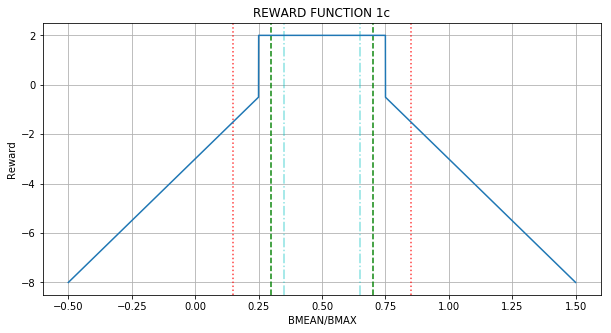

RF_1c(0)            =  -8.00
RF_1c(ENP_MARGIN/4) =  -8.00
RF_1c(ENP_MARGIN/2) =  -8.00
RF_1c(ENP_MARGIN)   =  -8.00

RF_1c(BMAX/2) =  -8.00
RF_1c(BMAX)   =  -8.00



In [15]:
#PLOT REWARD FUNCTIONS
x = np.arange(0-capm.BMAX*0.5,capm.BMAX+capm.BMAX*0.5)
y = [capm.rewardfn() for capm.v_btrack in x]

fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)
ax.set_title('REWARD FUNCTION 1c')
ax.set_xlabel('BMEAN/BMAX')
ax.set_ylabel('Reward')
ax.axvline((capm.ENP_MARGIN)/capm.BMAX, color='g',alpha=0.95, linestyle='--')
ax.axvline((capm.BMAX-capm.ENP_MARGIN)/capm.BMAX, color='g',alpha=0.95, linestyle='--')

ax.axvline((capm.BSAFE_LO)  /capm.BMAX, color='c',alpha=0.45, linestyle='-.')
ax.axvline((capm.BSAFE_HI)  /capm.BMAX, color='c',alpha=0.45, linestyle="-.")
ax.axvline((capm.BLIM_LO)   /capm.BMAX, color='r',alpha=0.75, linestyle=':')
ax.axvline((capm.BLIM_HI)   /capm.BMAX, color='r',alpha=0.75, linestyle=":")
ax.plot(x/capm.BMAX,y)
ax.grid(True)
plt.show()

capm.enp = 0;            print("RF_1c(0)            = {:6.2f}".format(capm.rewardfn()) )
capm.enp = capm.ENP_MARGIN/4; print("RF_1c(ENP_MARGIN/4) = {:6.2f}".format(capm.rewardfn()) )
capm.enp = capm.ENP_MARGIN/2; print("RF_1c(ENP_MARGIN/2) = {:6.2f}".format(capm.rewardfn()) )
capm.enp = capm.ENP_MARGIN;   print("RF_1c(ENP_MARGIN)   = {:6.2f}".format(capm.rewardfn()) )
print("");
capm.enp = capm.BMAX/2; print("RF_1c(BMAX/2) = {:6.2f}".format(capm.rewardfn()) )
capm.enp = capm.BMAX;   print("RF_1c(BMAX)   = {:6.2f}".format(capm.rewardfn()) )
print("");

In [16]:
#TRAINING STARTS
tic = datetime.now()

Device:  cpu

Iteration 0:  AOMORI, 2003 
EPSILON = 5.000e-01
LR = 3.392e-05
Average Terminal Reward  = -6.611
Day Violations           =    315
Battery Limit Violations =   3452
Action MEAN              =  4.816
Action STD DEV           =  2.004


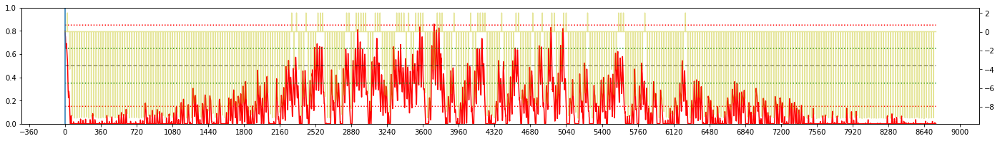


Iteration 1:  AOMORI, 2007 
EPSILON = 5.000e-01
LR = 4.174e-05
Average Terminal Reward  = -6.268
Day Violations           =    303
Battery Limit Violations =   3374
Action MEAN              =  4.945
Action STD DEV           =  2.098


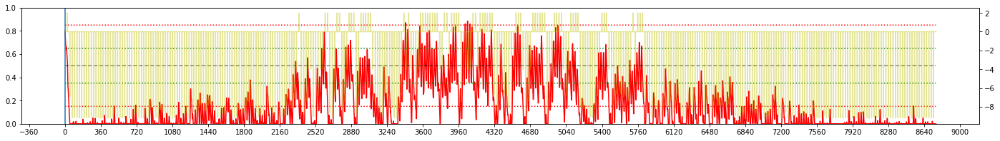


Iteration 2:  AOMORI, 2001 
EPSILON = 5.000e-01
LR = 5.000e-05
Average Terminal Reward  = -6.149
Day Violations           =    299
Battery Limit Violations =   3320
Action MEAN              =  4.896
Action STD DEV           =  2.052


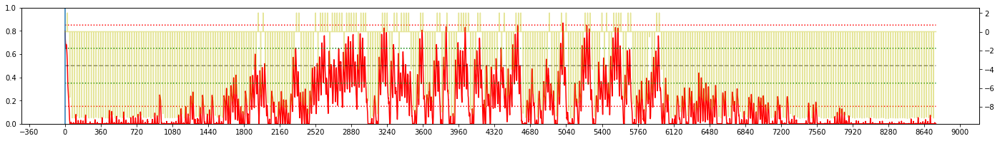


Iteration 3:  AOMORI, 2002 
EPSILON = 5.000e-01
LR = 5.826e-05
Average Terminal Reward  = -6.562
Day Violations           =    314
Battery Limit Violations =   3565
Action MEAN              =  4.841
Action STD DEV           =  2.020


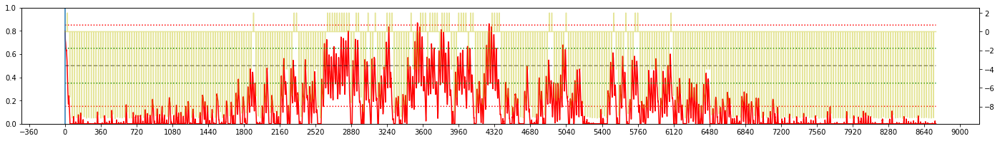


Iteration 4:  AOMORI, 2000 
EPSILON = 5.001e-01
LR = 6.608e-05
Average Terminal Reward  = -6.414
Day Violations           =    307
Battery Limit Violations =   3396
Action MEAN              =  4.852
Action STD DEV           =  2.052


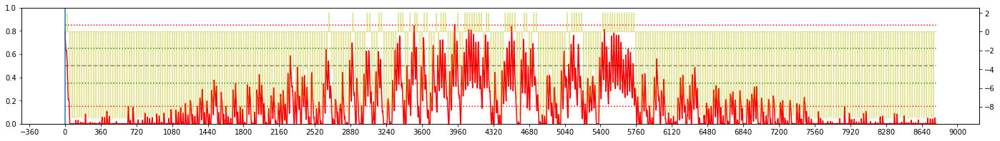


Iteration 5:  AOMORI, 2004 
EPSILON = 5.001e-01
LR = 7.311e-05
Average Terminal Reward  = -6.555
Day Violations           =    314
Battery Limit Violations =   3494
Action MEAN              =  4.858
Action STD DEV           =  1.995


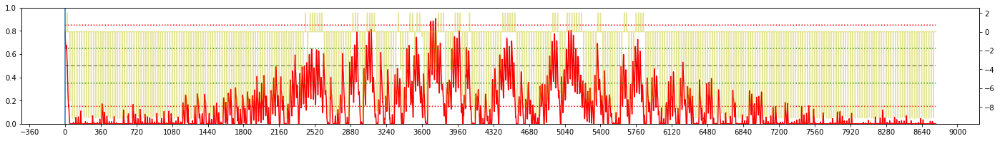


Iteration 6:  AOMORI, 2003 
EPSILON = 5.001e-01
LR = 7.914e-05
Average Terminal Reward  = -6.636
Day Violations           =    315
Battery Limit Violations =   3498
Action MEAN              =  4.862
Action STD DEV           =  1.974


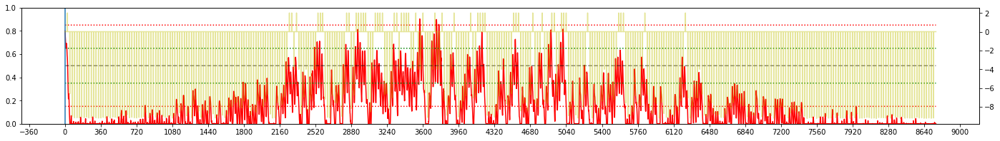


Iteration 7:  AOMORI, 2006 
EPSILON = 5.001e-01
LR = 8.411e-05
Average Terminal Reward  = -6.389
Day Violations           =    307
Battery Limit Violations =   3425
Action MEAN              =  4.804
Action STD DEV           =  2.014


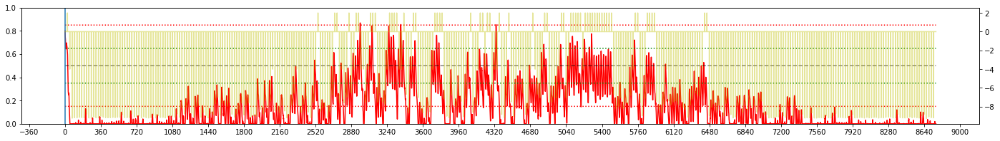


Iteration 8:  AOMORI, 2003 
EPSILON = 5.001e-01
LR = 8.808e-05
Average Terminal Reward  = -6.672
Day Violations           =    317
Battery Limit Violations =   3472
Action MEAN              =  4.820
Action STD DEV           =  1.989


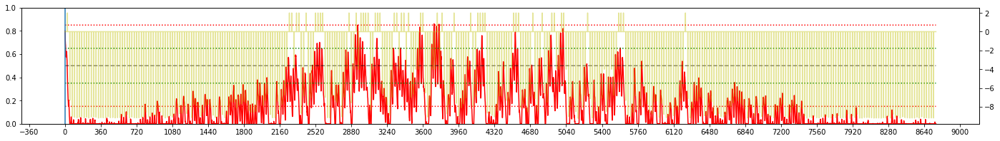


Iteration 9:  AOMORI, 2006 
EPSILON = 5.001e-01
LR = 9.116e-05
Average Terminal Reward  = -7.070
Day Violations           =    326
Battery Limit Violations =   3878
Action MEAN              =  5.585
Action STD DEV           =  2.582


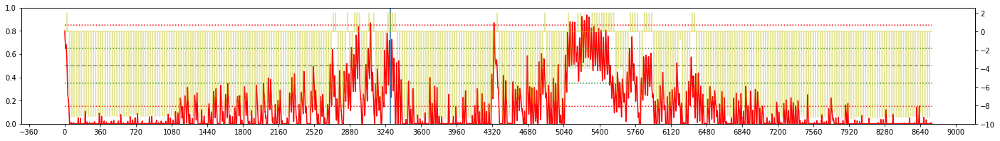


Iteration 10:  AOMORI, 2008 
EPSILON = 5.002e-01
LR = 9.350e-05
Average Terminal Reward  = -6.058
Day Violations           =    301
Battery Limit Violations =   3027
Action MEAN              =  5.077
Action STD DEV           =  2.885


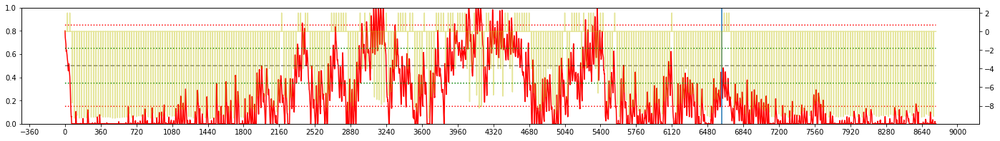


Iteration 11:  AOMORI, 2007 
EPSILON = 5.002e-01
LR = 9.526e-05
Average Terminal Reward  = -5.534
Day Violations           =    284
Battery Limit Violations =   2730
Action MEAN              =  4.783
Action STD DEV           =  2.914


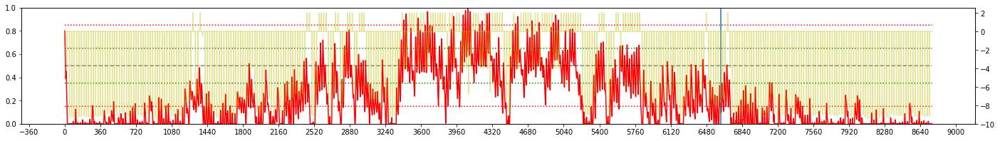


Iteration 12:  AOMORI, 2000 
EPSILON = 5.003e-01
LR = 9.656e-05
Average Terminal Reward  = -5.757
Day Violations           =    279
Battery Limit Violations =   3081
Action MEAN              =  5.150
Action STD DEV           =  3.046


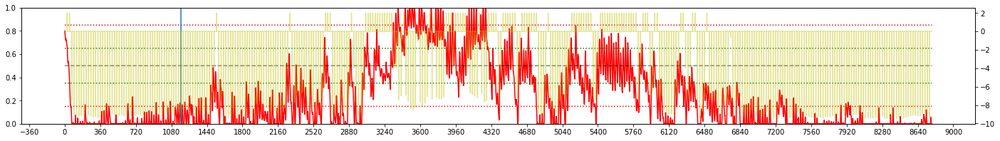


Iteration 13:  AOMORI, 2002 
EPSILON = 5.003e-01
LR = 9.751e-05
Average Terminal Reward  = -4.791
Day Violations           =    243
Battery Limit Violations =   2974
Action MEAN              =  5.034
Action STD DEV           =  3.131


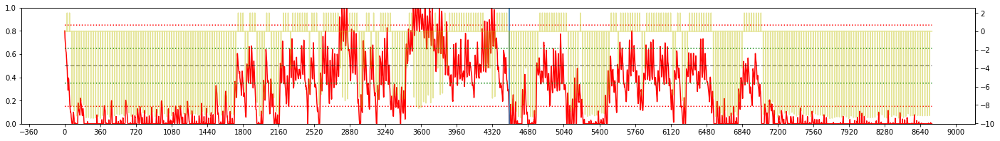


Iteration 14:  AOMORI, 2002 
EPSILON = 5.004e-01
LR = 9.820e-05
Average Terminal Reward  = -3.346
Day Violations           =    193
Battery Limit Violations =   2454
Action MEAN              =  4.576
Action STD DEV           =  3.083


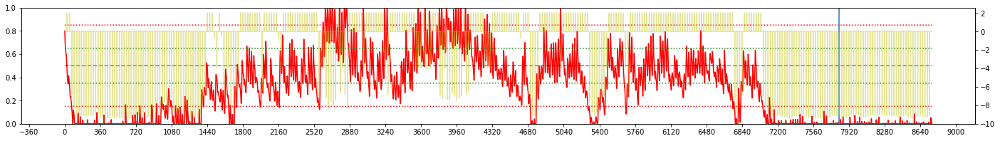


Iteration 15:  AOMORI, 2001 
EPSILON = 5.005e-01
LR = 9.870e-05
Average Terminal Reward  = -2.188
Day Violations           =    152
Battery Limit Violations =   2263
Action MEAN              =  4.829
Action STD DEV           =  3.081


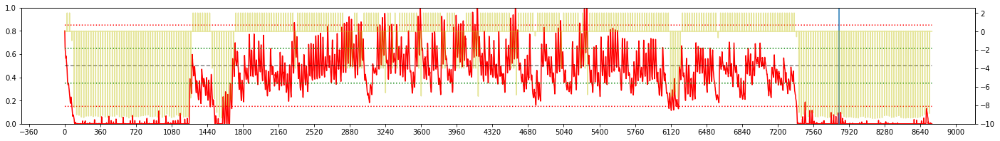


Iteration 16:  AOMORI, 2003 
EPSILON = 5.006e-01
LR = 9.907e-05
Average Terminal Reward  = -1.472
Day Violations           =    123
Battery Limit Violations =   1784
Action MEAN              =  4.150
Action STD DEV           =  3.032


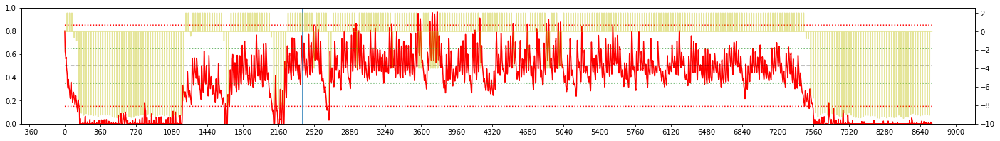


Iteration 17:  AOMORI, 2000 
EPSILON = 5.007e-01
LR = 9.933e-05
Average Terminal Reward  = -1.267
Day Violations           =    119
Battery Limit Violations =   1730
Action MEAN              =  4.053
Action STD DEV           =  2.949


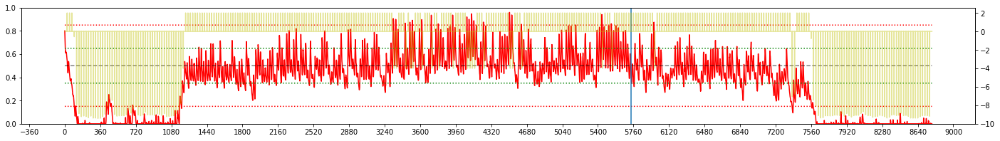


Iteration 18:  AOMORI, 2003 
EPSILON = 5.008e-01
LR = 9.952e-05
Average Terminal Reward  = -1.500
Day Violations           =    125
Battery Limit Violations =   2039
Action MEAN              =  4.346
Action STD DEV           =  2.973


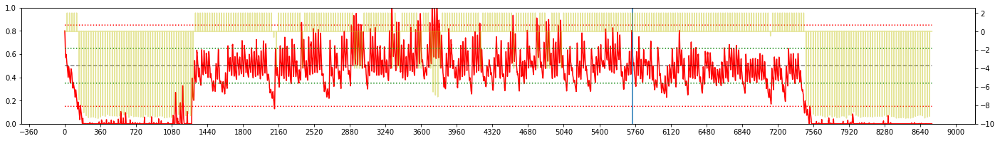


Iteration 19:  AOMORI, 2009 
EPSILON = 5.010e-01
LR = 9.966e-05
Average Terminal Reward  = -1.546
Day Violations           =    127
Battery Limit Violations =   2080
Action MEAN              =  4.517
Action STD DEV           =  2.970


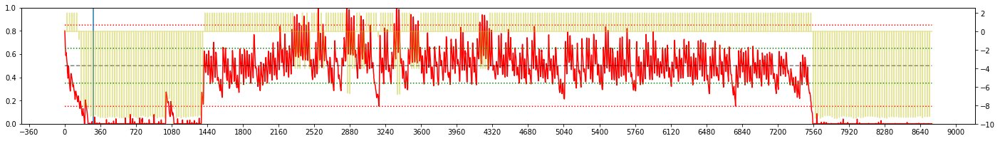


Iteration 20:  AOMORI, 2004 
EPSILON = 5.012e-01
LR = 9.975e-05
Average Terminal Reward  = -1.952
Day Violations           =    139
Battery Limit Violations =   2359
Action MEAN              =  4.248
Action STD DEV           =  3.051


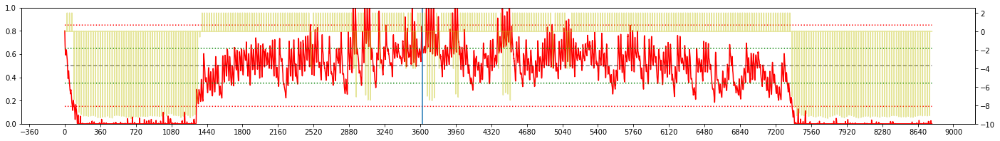


Iteration 21:  AOMORI, 2000 
EPSILON = 5.015e-01
LR = 9.982e-05
Average Terminal Reward  = -1.645
Day Violations           =    132
Battery Limit Violations =   2185
Action MEAN              =  4.528
Action STD DEV           =  3.163


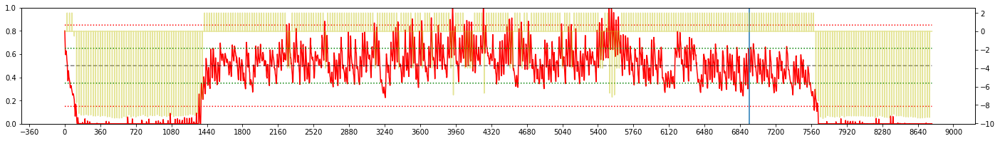


Iteration 22:  AOMORI, 2003 
EPSILON = 5.018e-01
LR = 9.987e-05
Average Terminal Reward  = -1.914
Day Violations           =    135
Battery Limit Violations =   2425
Action MEAN              =  4.436
Action STD DEV           =  3.048


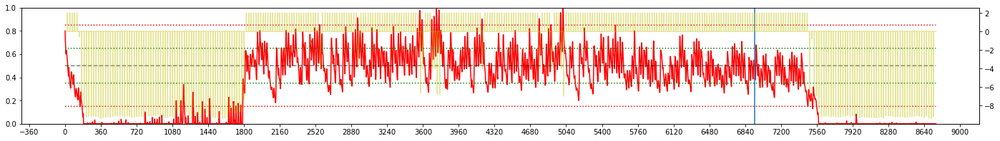


Iteration 23:  AOMORI, 2002 
EPSILON = 5.022e-01
LR = 9.991e-05
Average Terminal Reward  = -1.697
Day Violations           =    129
Battery Limit Violations =   2218
Action MEAN              =  4.429
Action STD DEV           =  3.085


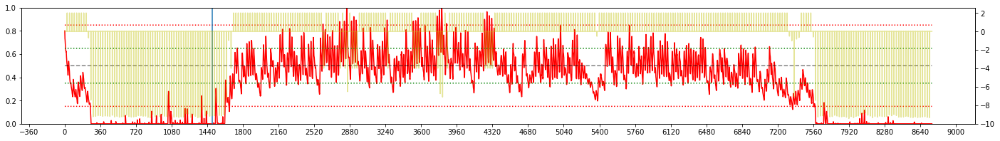


Iteration 24:  AOMORI, 2005 
EPSILON = 5.027e-01
LR = 9.993e-05
Average Terminal Reward  = -1.988
Day Violations           =    137
Battery Limit Violations =   2571
Action MEAN              =  4.587
Action STD DEV           =  3.008


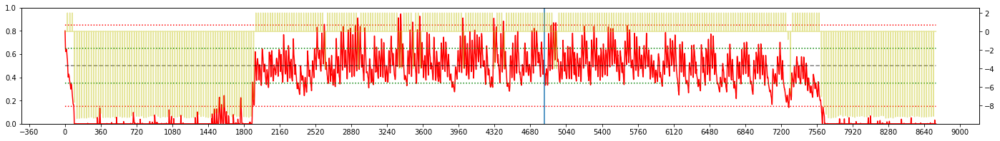


Iteration 25:  AOMORI, 2005 
EPSILON = 5.033e-01
LR = 9.995e-05
Average Terminal Reward  = -1.623
Day Violations           =    126
Battery Limit Violations =   2268
Action MEAN              =  4.263
Action STD DEV           =  3.048


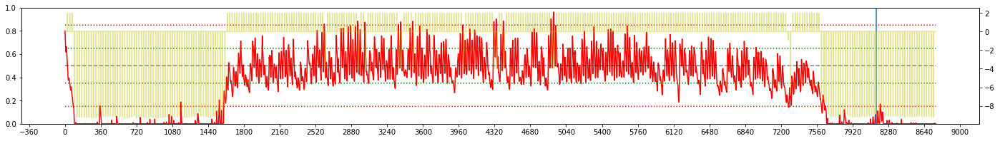


Iteration 26:  AOMORI, 2005 
EPSILON = 5.041e-01
LR = 9.997e-05
Average Terminal Reward  = -1.735
Day Violations           =    134
Battery Limit Violations =   2166
Action MEAN              =  4.162
Action STD DEV           =  3.037


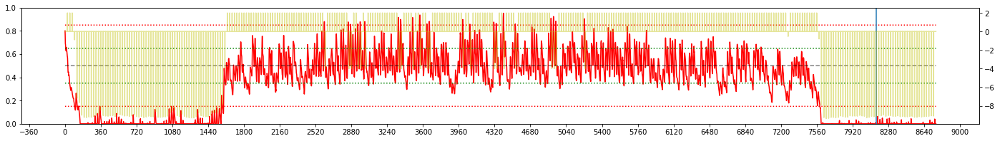


Iteration 27:  AOMORI, 2008 
EPSILON = 5.050e-01
LR = 9.998e-05
Average Terminal Reward  = -1.221
Day Violations           =    120
Battery Limit Violations =   1681
Action MEAN              =  4.252
Action STD DEV           =  3.229


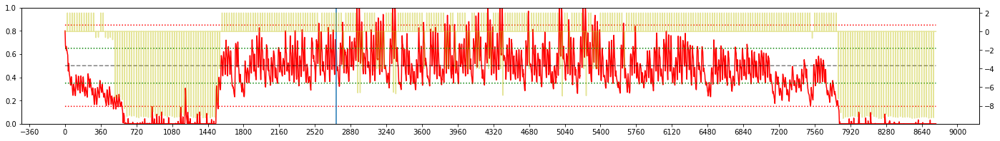


Iteration 28:  AOMORI, 2009 
EPSILON = 5.061e-01
LR = 9.998e-05
Average Terminal Reward  = -1.675
Day Violations           =    130
Battery Limit Violations =   2119
Action MEAN              =  4.323
Action STD DEV           =  3.108


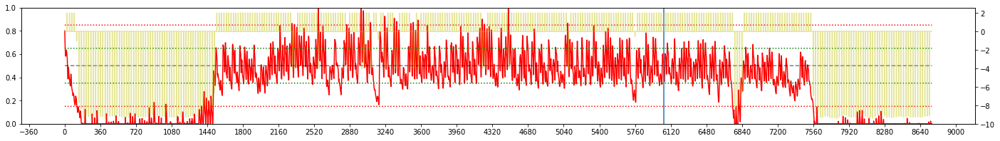


Iteration 29:  AOMORI, 2003 
EPSILON = 5.074e-01
LR = 9.999e-05
Average Terminal Reward  = -1.051
Day Violations           =    107
Battery Limit Violations =   1772
Action MEAN              =  4.002
Action STD DEV           =  2.928


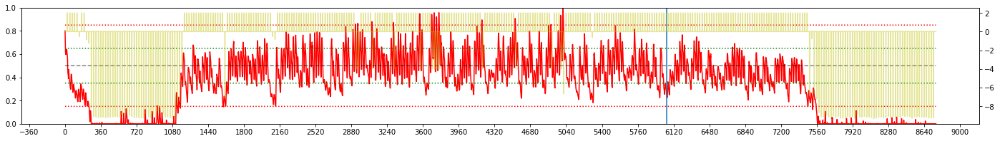


Iteration 30:  AOMORI, 2009 
EPSILON = 5.090e-01
LR = 9.999e-05
Average Terminal Reward  = -1.379
Day Violations           =    120
Battery Limit Violations =   2000
Action MEAN              =  4.244
Action STD DEV           =  3.125


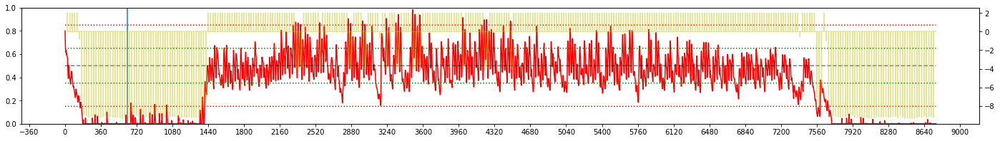


Iteration 31:  AOMORI, 2005 
EPSILON = 5.109e-01
LR = 9.999e-05
Average Terminal Reward  = -1.639
Day Violations           =    129
Battery Limit Violations =   2186
Action MEAN              =  4.345
Action STD DEV           =  3.197


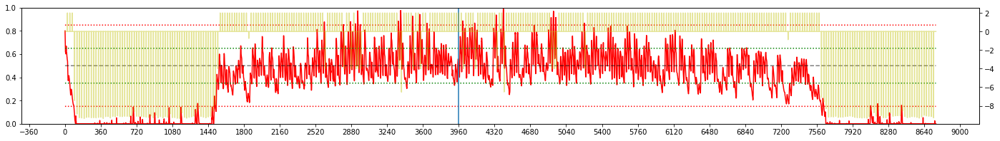


Iteration 32:  AOMORI, 2006 
EPSILON = 5.133e-01
LR = 1.000e-04
Average Terminal Reward  = -1.535
Day Violations           =    128
Battery Limit Violations =   2052
Action MEAN              =  4.121
Action STD DEV           =  3.120


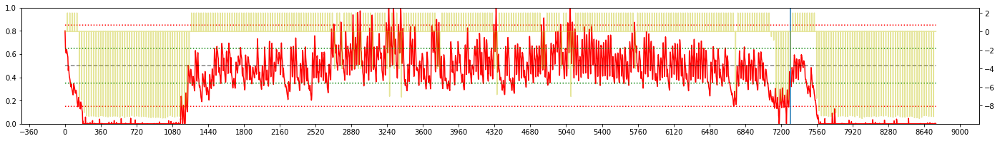


Iteration 33:  AOMORI, 2008 
EPSILON = 5.161e-01
LR = 1.000e-04
Average Terminal Reward  = -1.123
Day Violations           =    117
Battery Limit Violations =   1690
Action MEAN              =  4.382
Action STD DEV           =  3.195


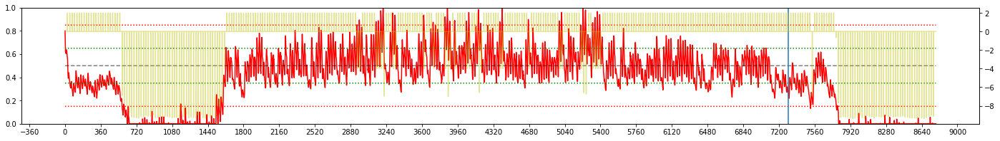


Iteration 34:  AOMORI, 2007 
EPSILON = 5.196e-01
LR = 1.000e-04
Average Terminal Reward  = -1.744
Day Violations           =    138
Battery Limit Violations =   2025
Action MEAN              =  4.390
Action STD DEV           =  3.230


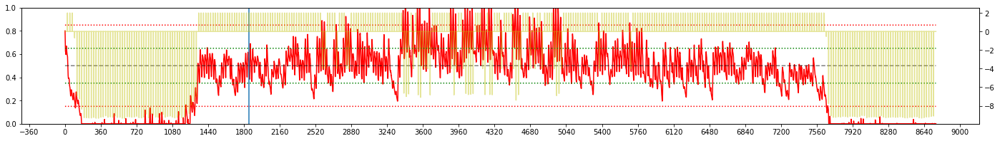


Iteration 35:  AOMORI, 2002 
EPSILON = 5.237e-01
LR = 1.000e-04
Average Terminal Reward  = -2.180
Day Violations           =    150
Battery Limit Violations =   2315
Action MEAN              =  4.669
Action STD DEV           =  3.382


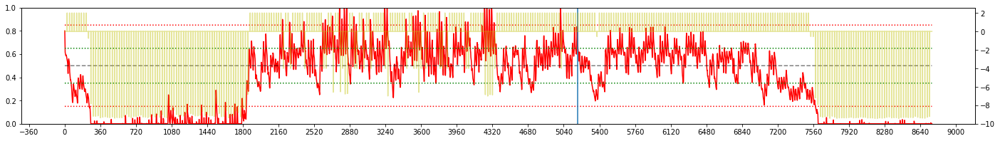


Iteration 36:  AOMORI, 2007 
EPSILON = 5.287e-01
LR = 1.000e-04
Average Terminal Reward  = -2.200
Day Violations           =    156
Battery Limit Violations =   2029
Action MEAN              =  4.476
Action STD DEV           =  3.232


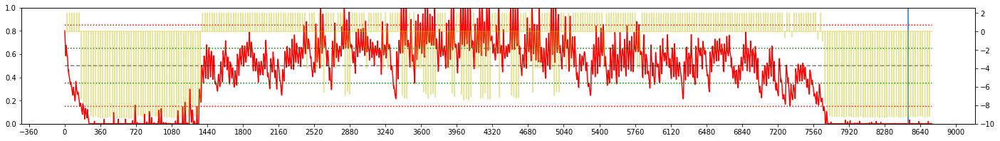


Iteration 37:  AOMORI, 2000 
EPSILON = 5.346e-01
LR = 1.000e-04
Average Terminal Reward  = -1.812
Day Violations           =    144
Battery Limit Violations =   2059
Action MEAN              =  4.084
Action STD DEV           =  3.176


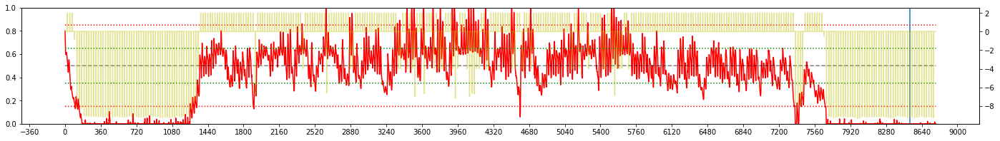


Iteration 38:  AOMORI, 2007 
EPSILON = 5.416e-01
LR = 1.000e-04
Average Terminal Reward  = -1.827
Day Violations           =    142
Battery Limit Violations =   2009
Action MEAN              =  4.133
Action STD DEV           =  3.196


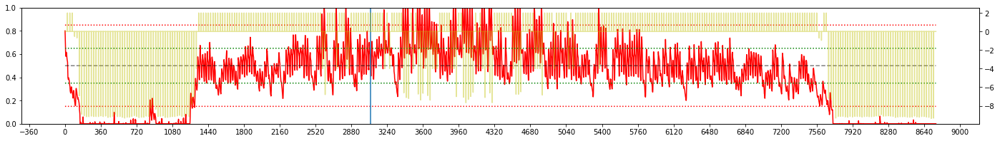


Iteration 39:  AOMORI, 2009 
EPSILON = 5.499e-01
LR = 1.000e-04
Average Terminal Reward  = -1.706
Day Violations           =    133
Battery Limit Violations =   2236
Action MEAN              =  4.392
Action STD DEV           =  3.266


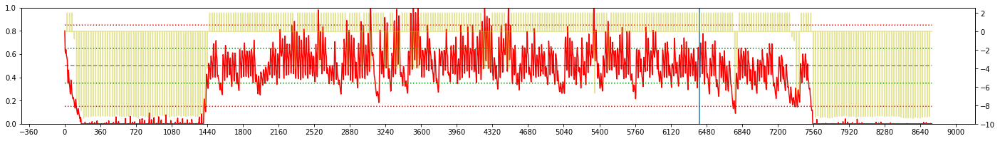


Iteration 40:  AOMORI, 2005 
EPSILON = 5.596e-01
LR = 1.000e-04
Average Terminal Reward  = -2.669
Day Violations           =    159
Battery Limit Violations =   3097
Action MEAN              =  4.943
Action STD DEV           =  3.264


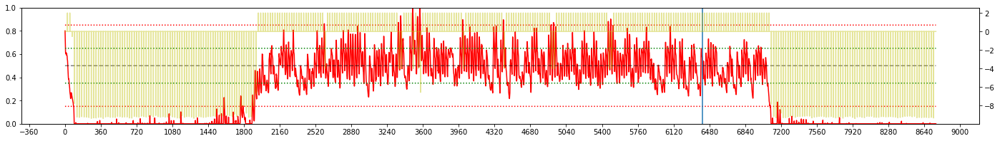


Iteration 41:  AOMORI, 2008 
EPSILON = 5.709e-01
LR = 1.000e-04
Average Terminal Reward  = -1.283
Day Violations           =    114
Battery Limit Violations =   1921
Action MEAN              =  4.464
Action STD DEV           =  3.199


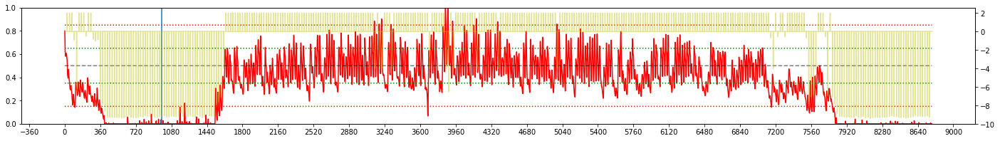


Iteration 42:  AOMORI, 2003 
EPSILON = 5.840e-01
LR = 1.000e-04
Average Terminal Reward  = -1.525
Day Violations           =    123
Battery Limit Violations =   1856
Action MEAN              =  4.301
Action STD DEV           =  3.268


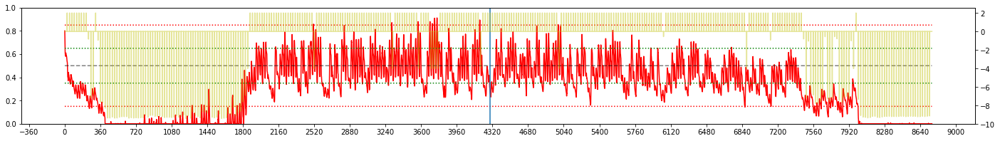


Iteration 43:  AOMORI, 2005 
EPSILON = 5.989e-01
LR = 1.000e-04
Average Terminal Reward  = -2.204
Day Violations           =    141
Battery Limit Violations =   2855
Action MEAN              =  4.733
Action STD DEV           =  3.283


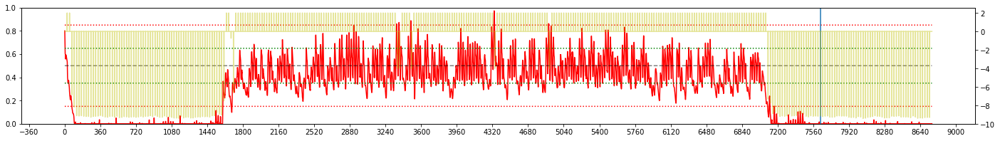


Iteration 44:  AOMORI, 2008 
EPSILON = 6.157e-01
LR = 1.000e-04
Average Terminal Reward  = -0.136
Day Violations           =     77
Battery Limit Violations =   1130
Action MEAN              =  3.967
Action STD DEV           =  3.162


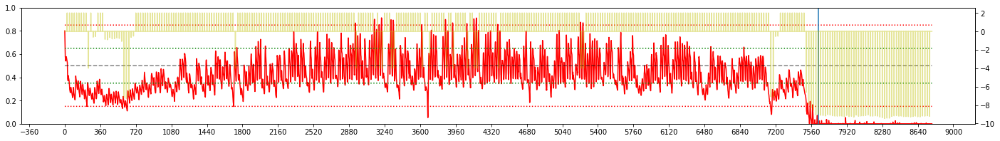


Iteration 45:  AOMORI, 2000 
EPSILON = 6.345e-01
LR = 1.000e-04
Average Terminal Reward  = -1.358
Day Violations           =    115
Battery Limit Violations =   2222
Action MEAN              =  4.480
Action STD DEV           =  3.359


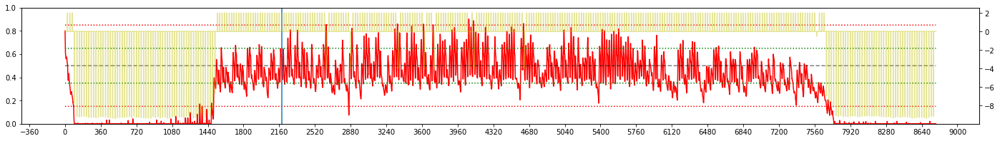


Iteration 46:  AOMORI, 2001 
EPSILON = 6.550e-01
LR = 1.000e-04
Average Terminal Reward  = -1.182
Day Violations           =    108
Battery Limit Violations =   2039
Action MEAN              =  4.494
Action STD DEV           =  3.225


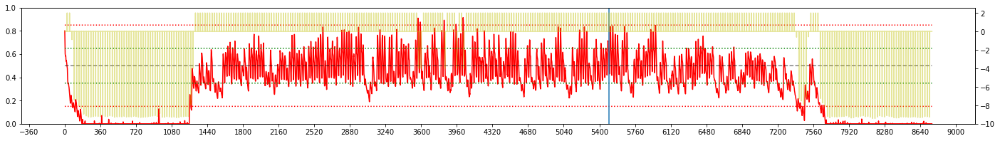


Iteration 47:  AOMORI, 2007 
EPSILON = 6.772e-01
LR = 1.000e-04
Average Terminal Reward  = -1.918
Day Violations           =    133
Battery Limit Violations =   2470
Action MEAN              =  5.036
Action STD DEV           =  3.411


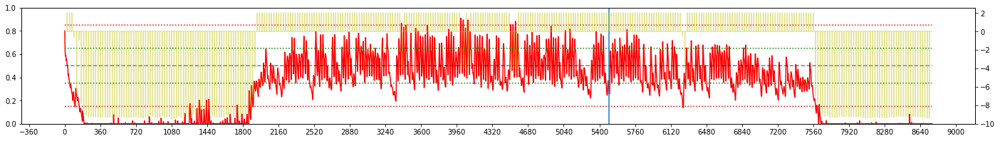


Iteration 48:  AOMORI, 2006 
EPSILON = 7.007e-01
LR = 1.000e-04
Average Terminal Reward  = -1.548
Day Violations           =    119
Battery Limit Violations =   2320
Action MEAN              =  4.371
Action STD DEV           =  3.035


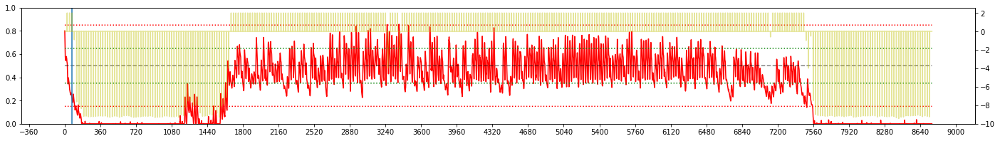


Iteration 49:  AOMORI, 2009 
EPSILON = 7.251e-01
LR = 1.000e-04
Average Terminal Reward  = -1.493
Day Violations           =    119
Battery Limit Violations =   2256
Action MEAN              =  4.312
Action STD DEV           =  3.136


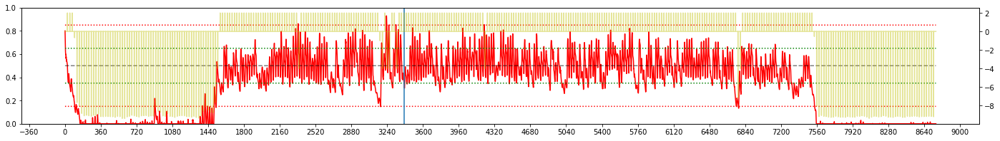


Iteration 50:  AOMORI, 2007 
EPSILON = 7.500e-01
LR = 1.000e-04
Average Terminal Reward  = -2.427
Day Violations           =    154
Battery Limit Violations =   2752
Action MEAN              =  4.567
Action STD DEV           =  3.324


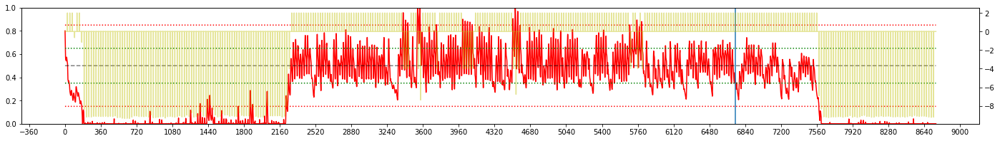


Iteration 51:  AOMORI, 2008 
EPSILON = 7.749e-01
LR = 8.750e-05
Average Terminal Reward  =  0.188
Day Violations           =     63
Battery Limit Violations =   1192
Action MEAN              =  3.949
Action STD DEV           =  3.173


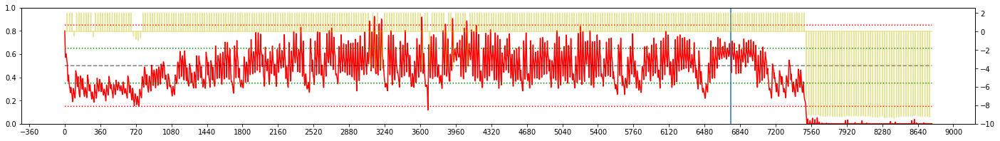


Iteration 52:  AOMORI, 2001 
EPSILON = 7.993e-01
LR = 7.681e-05
Average Terminal Reward  = -1.707
Day Violations           =    126
Battery Limit Violations =   2473
Action MEAN              =  4.600
Action STD DEV           =  3.281


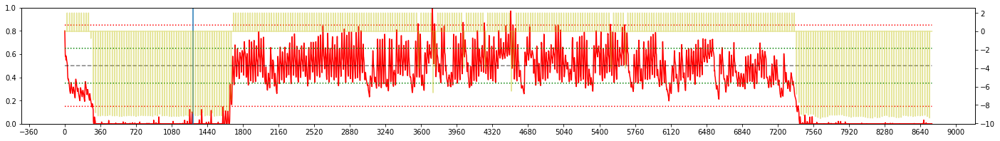


Iteration 53:  AOMORI, 2001 
EPSILON = 8.228e-01
LR = 6.767e-05
Average Terminal Reward  = -1.509
Day Violations           =    118
Battery Limit Violations =   2182
Action MEAN              =  4.507
Action STD DEV           =  3.473


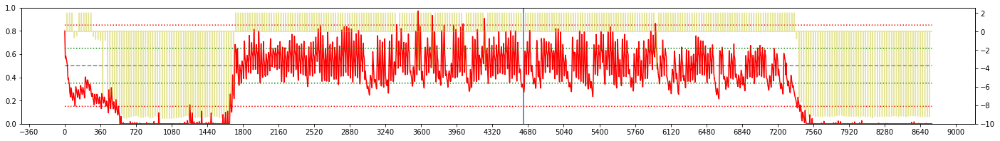


Iteration 54:  AOMORI, 2002 
EPSILON = 8.450e-01
LR = 5.986e-05
Average Terminal Reward  = -1.669
Day Violations           =    125
Battery Limit Violations =   2343
Action MEAN              =  4.262
Action STD DEV           =  3.336


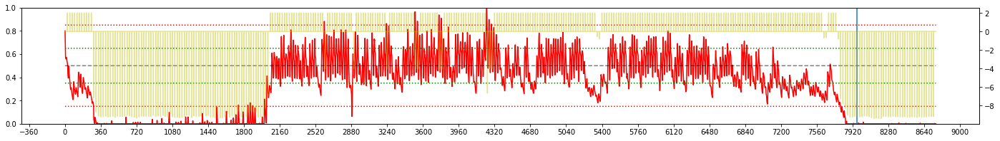


Iteration 55:  AOMORI, 2004 
EPSILON = 8.655e-01
LR = 5.318e-05
Average Terminal Reward  = -0.892
Day Violations           =     99
Battery Limit Violations =   1685
Action MEAN              =  3.929
Action STD DEV           =  3.208


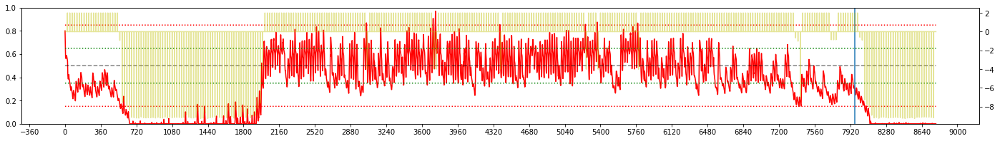


Iteration 56:  AOMORI, 2007 
EPSILON = 8.843e-01
LR = 4.747e-05
Average Terminal Reward  =  0.593
Day Violations           =     51
Battery Limit Violations =    899
Action MEAN              =  3.793
Action STD DEV           =  3.176


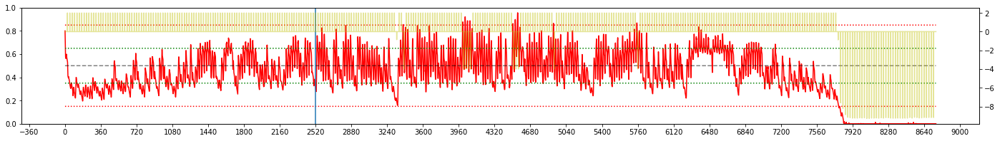


Iteration 57:  AOMORI, 2008 
EPSILON = 9.011e-01
LR = 4.259e-05
Average Terminal Reward  =  0.397
Day Violations           =     61
Battery Limit Violations =    901
Action MEAN              =  3.847
Action STD DEV           =  3.175


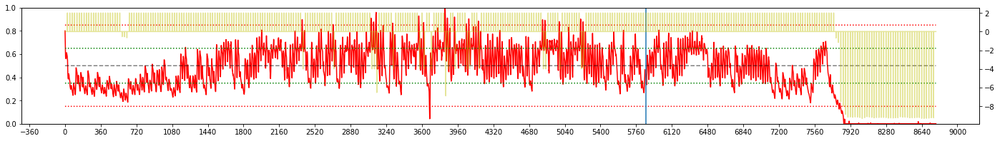


Iteration 58:  AOMORI, 2006 
EPSILON = 9.160e-01
LR = 3.841e-05
Average Terminal Reward  =  0.453
Day Violations           =     51
Battery Limit Violations =   1085
Action MEAN              =  3.757
Action STD DEV           =  2.764


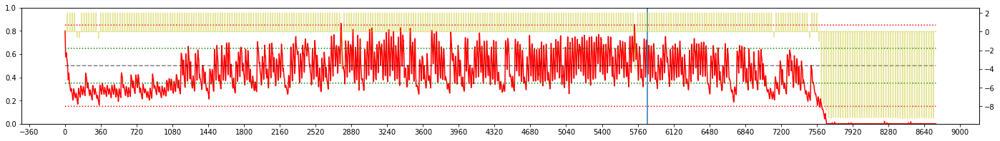


Iteration 59:  AOMORI, 2006 
EPSILON = 9.291e-01
LR = 3.484e-05
Average Terminal Reward  = -1.146
Day Violations           =    102
Battery Limit Violations =   2106
Action MEAN              =  4.177
Action STD DEV           =  2.940


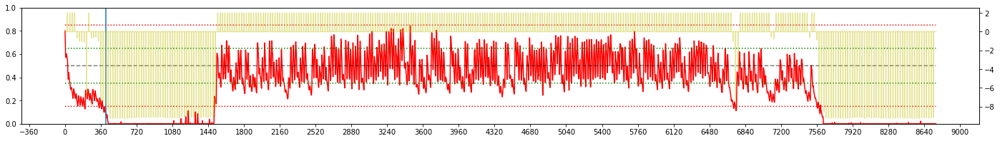


Iteration 60:  AOMORI, 2005 
EPSILON = 9.404e-01
LR = 3.179e-05
Average Terminal Reward  = -1.019
Day Violations           =    100
Battery Limit Violations =   2056
Action MEAN              =  4.166
Action STD DEV           =  3.081


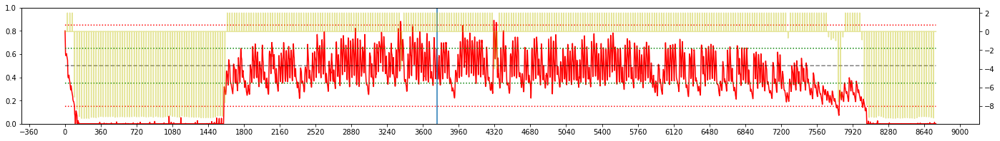


Iteration 61:  AOMORI, 2009 
EPSILON = 9.501e-01
LR = 2.918e-05
Average Terminal Reward  =  0.308
Day Violations           =     56
Battery Limit Violations =   1156
Action MEAN              =  3.878
Action STD DEV           =  2.766


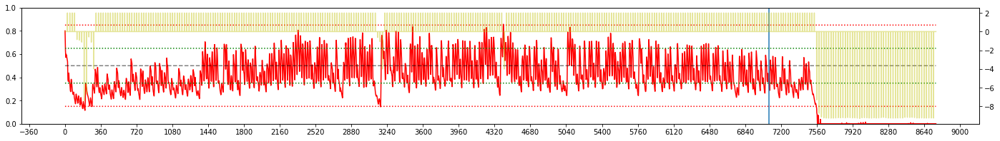


Iteration 62:  AOMORI, 2006 
EPSILON = 9.584e-01
LR = 2.695e-05
Average Terminal Reward  =  0.428
Day Violations           =     50
Battery Limit Violations =   1118
Action MEAN              =  3.745
Action STD DEV           =  2.739


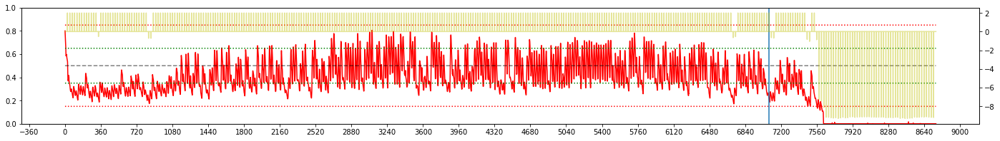


Iteration 63:  AOMORI, 2003 
EPSILON = 9.654e-01
LR = 2.504e-05
Average Terminal Reward  =  1.020
Day Violations           =     34
Battery Limit Violations =    520
Action MEAN              =  3.378
Action STD DEV           =  2.588


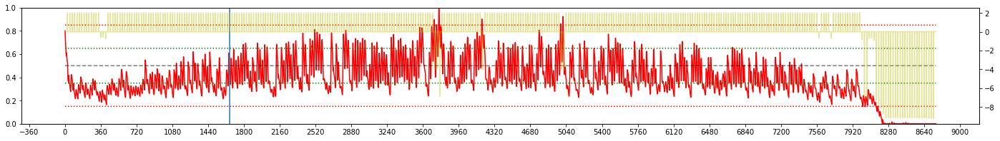


Iteration 64:  AOMORI, 2004 
EPSILON = 9.713e-01
LR = 2.341e-05
Average Terminal Reward  =  0.911
Day Violations           =     35
Battery Limit Violations =    648
Action MEAN              =  3.389
Action STD DEV           =  2.674


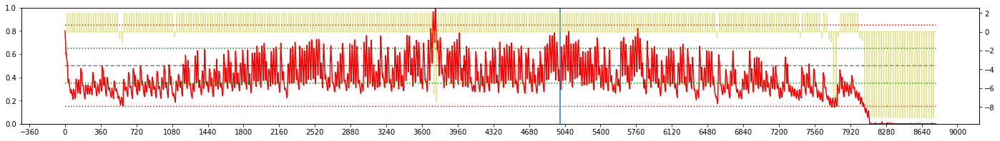


Iteration 65:  AOMORI, 2001 
EPSILON = 9.763e-01
LR = 2.202e-05
Average Terminal Reward  = -1.095
Day Violations           =    105
Battery Limit Violations =   2094
Action MEAN              =  4.204
Action STD DEV           =  2.853


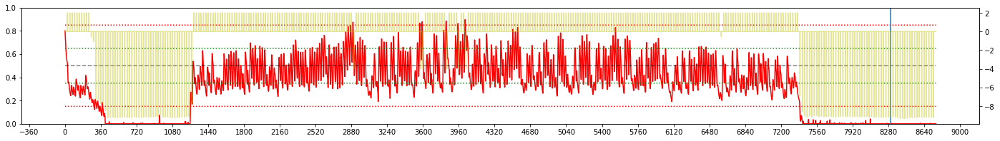


Iteration 66:  AOMORI, 2000 
EPSILON = 9.804e-01
LR = 2.082e-05
Average Terminal Reward  = -0.296
Day Violations           =     75
Battery Limit Violations =   1490
Action MEAN              =  4.010
Action STD DEV           =  3.086


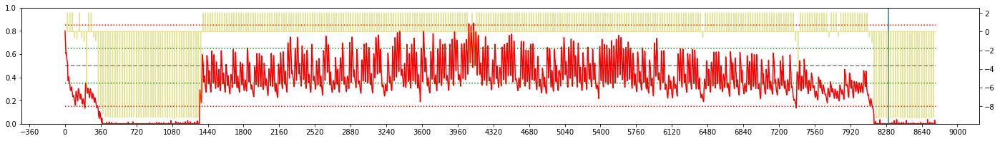


Iteration 67:  AOMORI, 2003 
EPSILON = 9.839e-01
LR = 1.980e-05
Average Terminal Reward  =  1.075
Day Violations           =     30
Battery Limit Violations =    519
Action MEAN              =  3.364
Action STD DEV           =  2.674


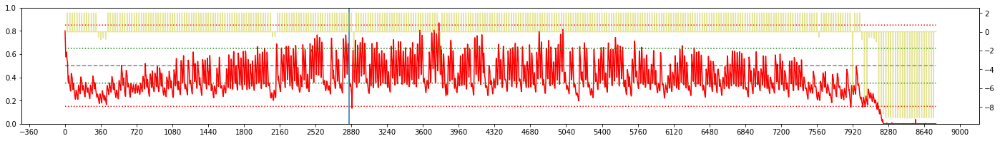


Iteration 68:  AOMORI, 2003 
EPSILON = 9.867e-01
LR = 1.893e-05
Average Terminal Reward  =  0.997
Day Violations           =     33
Battery Limit Violations =    632
Action MEAN              =  3.434
Action STD DEV           =  2.767


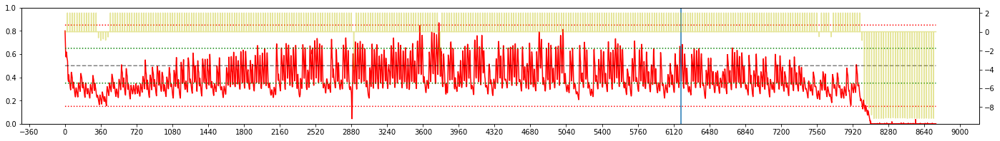


Iteration 69:  AOMORI, 2000 
EPSILON = 9.891e-01
LR = 1.819e-05
Average Terminal Reward  = -0.242
Day Violations           =     73
Battery Limit Violations =   1494
Action MEAN              =  3.862
Action STD DEV           =  3.104


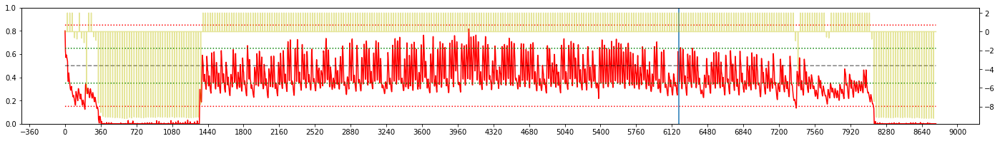


Iteration 70:  AOMORI, 2009 
EPSILON = 9.910e-01
LR = 1.755e-05
Average Terminal Reward  =  0.396
Day Violations           =     51
Battery Limit Violations =   1159
Action MEAN              =  3.833
Action STD DEV           =  2.971


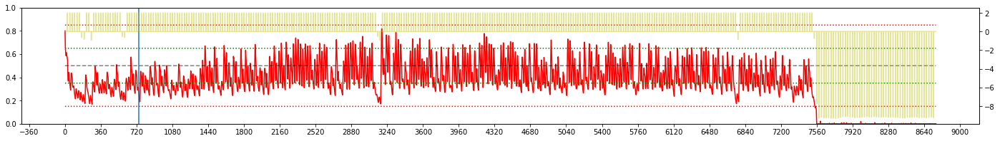


Iteration 71:  AOMORI, 2007 
EPSILON = 9.926e-01
LR = 1.701e-05
Average Terminal Reward  =  0.602
Day Violations           =     45
Battery Limit Violations =    833
Action MEAN              =  3.752
Action STD DEV           =  3.139


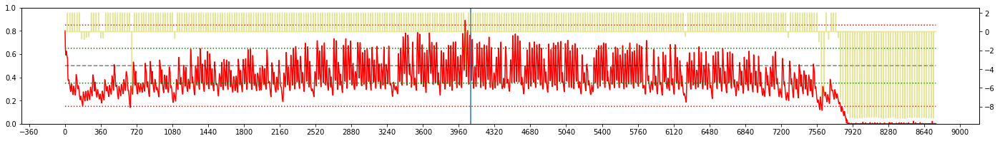


Iteration 72:  AOMORI, 2004 
EPSILON = 9.939e-01
LR = 1.654e-05
Average Terminal Reward  =  0.618
Day Violations           =     45
Battery Limit Violations =    966
Action MEAN              =  3.542
Action STD DEV           =  2.924


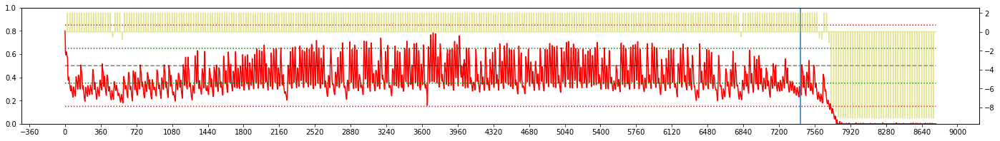


Iteration 73:  AOMORI, 2003 
EPSILON = 9.950e-01
LR = 1.614e-05
Average Terminal Reward  =  0.937
Day Violations           =     34
Battery Limit Violations =    672
Action MEAN              =  3.529
Action STD DEV           =  2.933


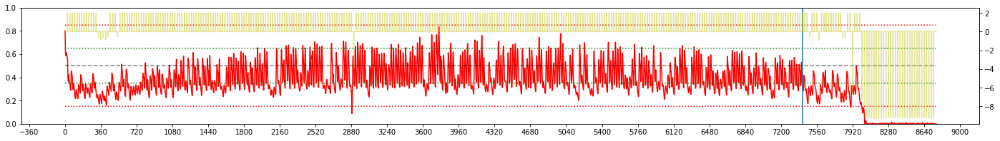


Iteration 74:  AOMORI, 2005 
EPSILON = 9.959e-01
LR = 1.580e-05
Average Terminal Reward  = -0.338
Day Violations           =     75
Battery Limit Violations =   1446
Action MEAN              =  3.991
Action STD DEV           =  3.188


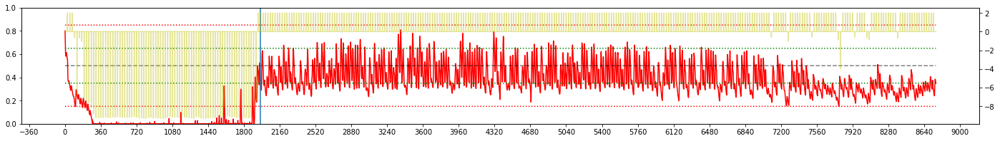


Iteration 75:  AOMORI, 2000 
EPSILON = 9.967e-01
LR = 1.551e-05
Average Terminal Reward  = -0.918
Day Violations           =     95
Battery Limit Violations =   1880
Action MEAN              =  4.062
Action STD DEV           =  3.189


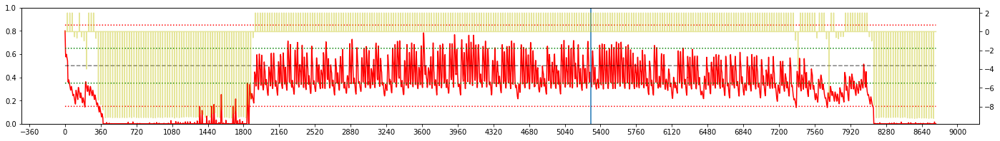


Iteration 76:  AOMORI, 2006 
EPSILON = 9.973e-01
LR = 1.526e-05
Average Terminal Reward  =  0.418
Day Violations           =     51
Battery Limit Violations =   1150
Action MEAN              =  3.786
Action STD DEV           =  3.101


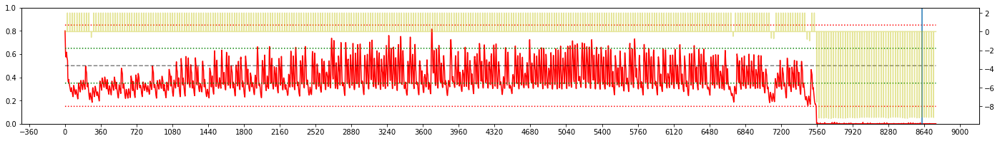


Iteration 77:  AOMORI, 2001 
EPSILON = 9.978e-01
LR = 1.505e-05
Average Terminal Reward  =  0.217
Day Violations           =     59
Battery Limit Violations =   1281
Action MEAN              =  3.871
Action STD DEV           =  3.082


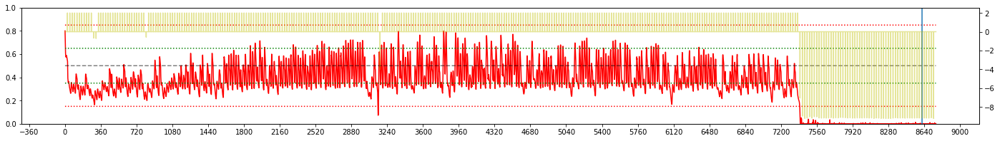


Iteration 78:  AOMORI, 2007 
EPSILON = 9.982e-01
LR = 1.487e-05
Average Terminal Reward  =  0.598
Day Violations           =     45
Battery Limit Violations =    880
Action MEAN              =  3.726
Action STD DEV           =  3.096


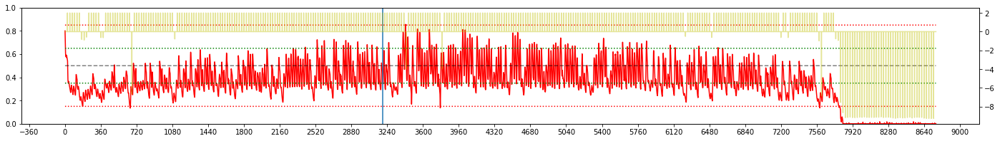


Iteration 79:  AOMORI, 2004 
EPSILON = 9.985e-01
LR = 1.471e-05
Average Terminal Reward  =  0.562
Day Violations           =     46
Battery Limit Violations =    929
Action MEAN              =  3.541
Action STD DEV           =  2.909


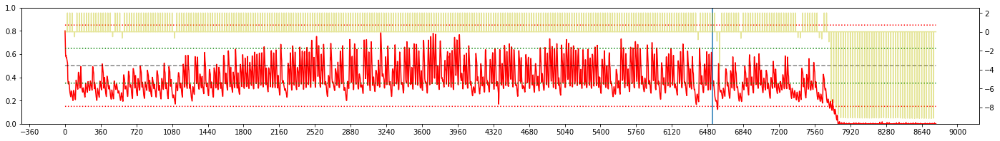


Iteration 80:  AOMORI, 2005 
EPSILON = 9.988e-01
LR = 1.458e-05
Average Terminal Reward  = -0.793
Day Violations           =     90
Battery Limit Violations =   1732
Action MEAN              =  3.879
Action STD DEV           =  3.196


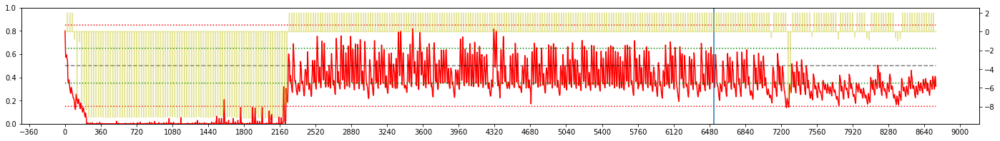


Iteration 81:  AOMORI, 2005 
EPSILON = 9.990e-01
LR = 1.446e-05
Average Terminal Reward  = -0.446
Day Violations           =     80
Battery Limit Violations =   1574
Action MEAN              =  3.813
Action STD DEV           =  3.210


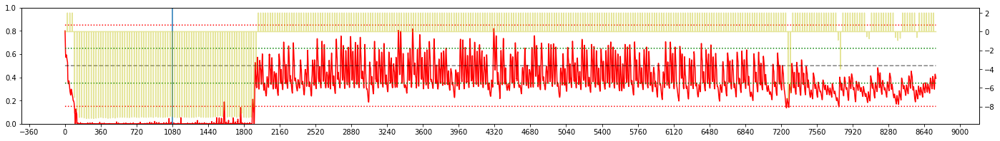


Iteration 82:  AOMORI, 2001 
EPSILON = 9.992e-01
LR = 1.437e-05
Average Terminal Reward  =  0.140
Day Violations           =     61
Battery Limit Violations =   1262
Action MEAN              =  3.820
Action STD DEV           =  3.042


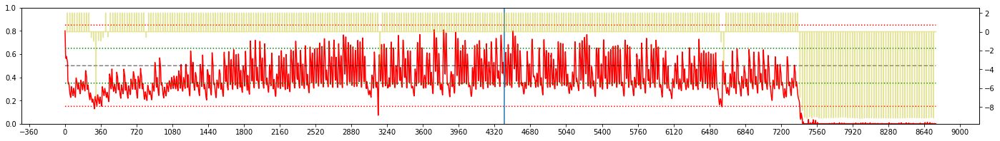


Iteration 83:  AOMORI, 2006 
EPSILON = 9.993e-01
LR = 1.428e-05
Average Terminal Reward  =  0.391
Day Violations           =     51
Battery Limit Violations =   1179
Action MEAN              =  3.743
Action STD DEV           =  2.911


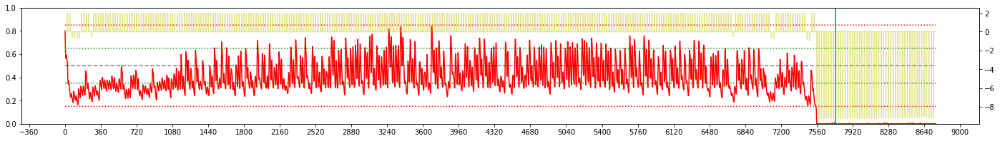


Iteration 84:  AOMORI, 2009 
EPSILON = 9.994e-01
LR = 1.421e-05
Average Terminal Reward  = -1.177
Day Violations           =    105
Battery Limit Violations =   2187
Action MEAN              =  4.329
Action STD DEV           =  2.995


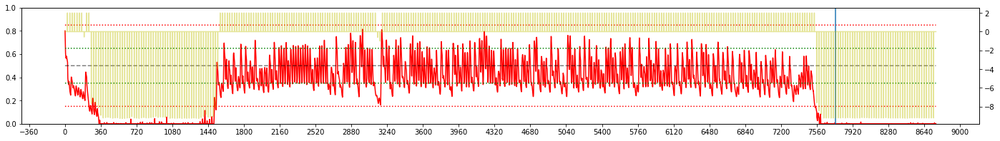


Iteration 85:  AOMORI, 2003 
EPSILON = 9.995e-01
LR = 1.415e-05
Average Terminal Reward  =  0.970
Day Violations           =     34
Battery Limit Violations =    633
Action MEAN              =  3.458
Action STD DEV           =  2.771


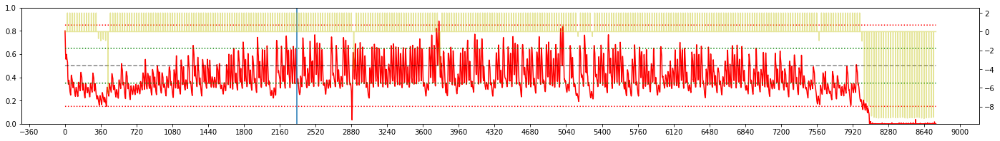


Iteration 86:  AOMORI, 2003 
EPSILON = 9.996e-01
LR = 1.410e-05
Average Terminal Reward  =  0.957
Day Violations           =     34
Battery Limit Violations =    618
Action MEAN              =  3.509
Action STD DEV           =  2.789


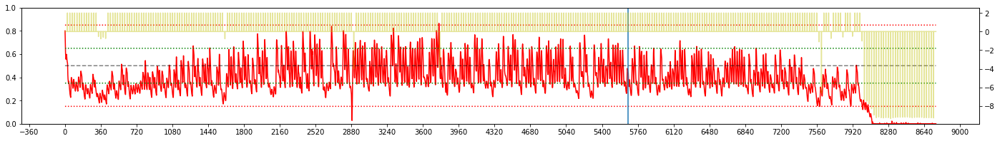


Iteration 87:  AOMORI, 2000 
EPSILON = 9.997e-01
LR = 1.406e-05
Average Terminal Reward  = -0.514
Day Violations           =     83
Battery Limit Violations =   1742
Action MEAN              =  4.076
Action STD DEV           =  3.009


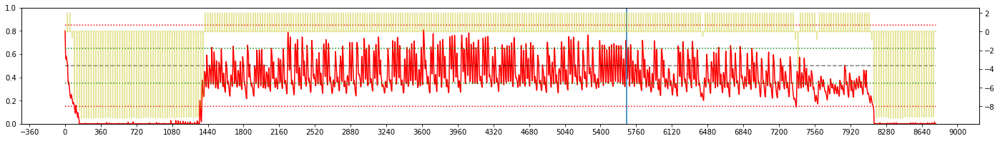


Iteration 88:  AOMORI, 2005 
EPSILON = 9.997e-01
LR = 1.402e-05
Average Terminal Reward  = -0.103
Day Violations           =     68
Battery Limit Violations =   1267
Action MEAN              =  3.814
Action STD DEV           =  3.040


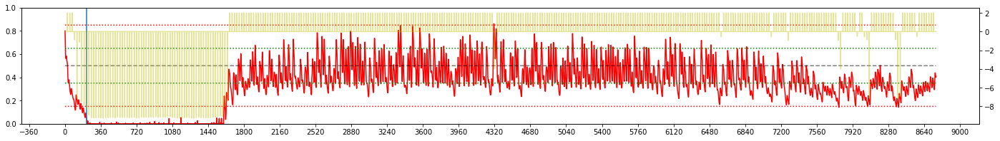


Iteration 89:  AOMORI, 2009 
EPSILON = 9.998e-01
LR = 1.398e-05
Average Terminal Reward  = -1.371
Day Violations           =    110
Battery Limit Violations =   2392
Action MEAN              =  4.948
Action STD DEV           =  3.030


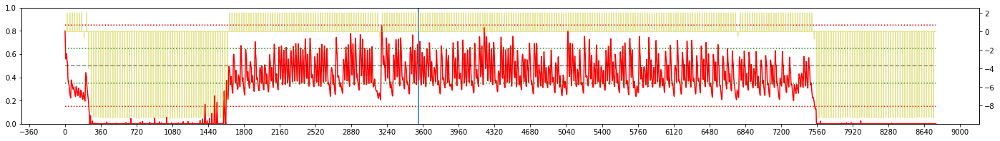


Iteration 90:  AOMORI, 2007 
EPSILON = 9.998e-01
LR = 1.396e-05
Average Terminal Reward  =  0.669
Day Violations           =     43
Battery Limit Violations =    887
Action MEAN              =  3.729
Action STD DEV           =  2.924


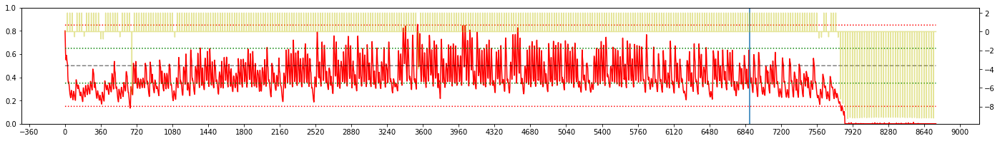


Iteration 91:  AOMORI, 2005 
EPSILON = 9.999e-01
LR = 1.393e-05
Average Terminal Reward  = -0.479
Day Violations           =     82
Battery Limit Violations =   1584
Action MEAN              =  3.878
Action STD DEV           =  3.044


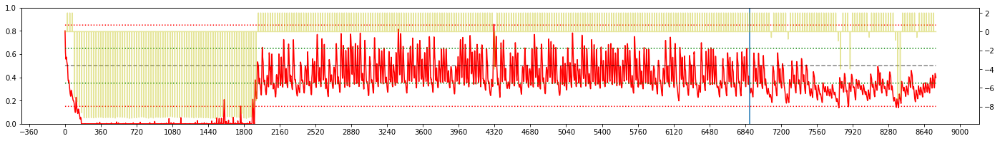


Iteration 92:  AOMORI, 2004 
EPSILON = 9.999e-01
LR = 1.391e-05
Average Terminal Reward  =  0.548
Day Violations           =     47
Battery Limit Violations =   1029
Action MEAN              =  3.916
Action STD DEV           =  2.942


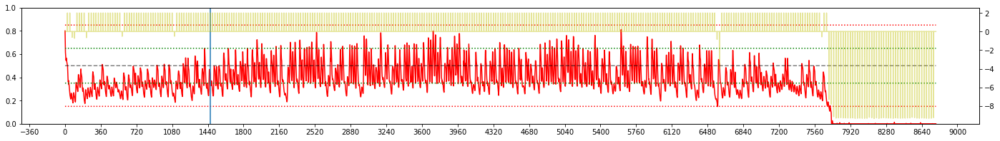


Iteration 93:  AOMORI, 2001 
EPSILON = 9.999e-01
LR = 1.390e-05
Average Terminal Reward  =  0.172
Day Violations           =     60
Battery Limit Violations =   1301
Action MEAN              =  3.929
Action STD DEV           =  3.047


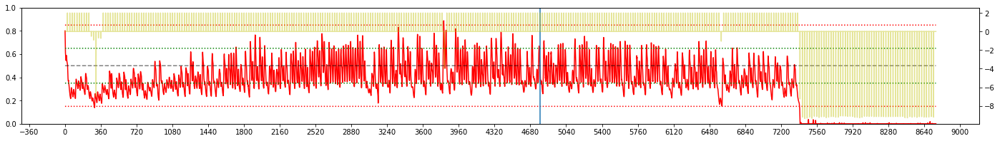


Iteration 94:  AOMORI, 2000 
EPSILON = 9.999e-01
LR = 1.388e-05
Average Terminal Reward  = -1.694
Day Violations           =    122
Battery Limit Violations =   2420
Action MEAN              =  4.422
Action STD DEV           =  3.237


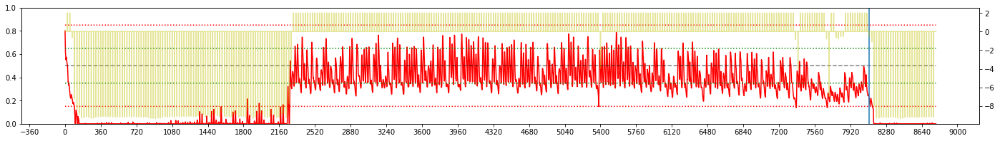

In [ ]:
#TRAIN 
dqn = DQN()
# for recording weights
oldfc1 = dqn.eval_net.fc1.weight.data.cpu().numpy().flatten()
old2fc1 = oldfc1

# oldfc2 = dqn.eval_net.fc2.weight.data.cpu().numpy().flatten()
# old2fc2 = oldfc2

# oldfc3 = dqn.eval_net.fc3.weight.data.cpu().numpy().flatten()
# old2fc3 = oldfc3

oldout = dqn.eval_net.fc_out.weight.data.cpu().numpy().flatten()
old2out = oldout
########################################

change_hr = 0 #when dqn target_net is updated by eval_net
avg_reward_rec = [] #record the yearly average rewards over the entire duration of training
batt_violation_rec = []
day_violation_rec = []

print('Device: ', dqn.device)
#TRAINING STARTS
tic = datetime.now()

e_rec = []
lr_rec = []
for iteration in range(NO_OF_ITERATIONS):
    # EPSILON SCHEDULING
    e_slope = 5
    e_start = 0.5
    e_inflection_point = 50
    EPSILON = e_start + (1-e_start)/(1 + np.exp(-(iteration-e_inflection_point)/e_slope))

    # LR SCEHDULING
    lr_slope = 3
    lr_start = 0
    lr_inflection_point = 2
    if iteration <=50:
        lrate =  (lr_start + (1-lr_start)/(1 + np.exp(-(iteration-lr_inflection_point)/lr_slope)))*1e-4
    else:
        lrate = 0.95*(lrate-lrate*0.1)+0.2*1e-5
    dqn.optimizer = torch.optim.Adam(dqn.eval_net.parameters(), lr=lrate)
#     dqn.optimizer = torch.optim.Adam(dqn.eval_net.parameters(), lr=lrate, weight_decay=WT_DECAY))
    lr_rec= np.append(lr_rec,lrate)

    LOCATION    = 'aomori'#random.choice(['tokyo','wakkanai','minamidaito'])
    YEAR        = random.choice(np.arange(2000,2010))
    
    capm        = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
    capm.eno    = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
    capm.HMAX   = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object


    s, r, day_end, year_end = capm.reset(batt=0.8*capm.BMAX)
    yr_record      = np.empty(4)
    transition_rec = np.zeros((capm.eno.TIME_STEPS, N_STATES * 2 + 2)) #record all the transition in one day

    while True:
        a = dqn.choose_action(stdize(s))
        yr_record = np.vstack((yr_record, [s[0],s[2],r, a]))

        # take action
        s_, r, day_end, year_end = capm.step(a)
        
        temp_transitions                = np.hstack((stdize(s), [a, r], stdize(s_)))
        transition_rec[capm.eno.hr-1,:] = temp_transitions

        if (day_end):
            transition_rec[:,5]  = r #broadcast reward to all states
            decay_factor         = [i for i in (LAMBDA**n for n in reversed(range(0, capm.eno.TIME_STEPS)))]
            transition_rec[:,5]  = transition_rec[:,5] * decay_factor #decay reward proportionately
            dqn.store_day_transition(transition_rec)

        if dqn.good_memory_counter > MEMORY_CAPACITY and dqn.bad_memory_counter > MEMORY_CAPACITY:
            dqn.learn()

        if dqn.nettoggle:
            change_hr = capm.eno.day*24+capm.eno.hr #to mark when the DQN is updated.
            dqn.nettoggle = not dqn.nettoggle

        if (year_end):
            break

        # transition to new state
        s = s_

    yr_record = np.delete(yr_record, 0, 0)     #remove the first row which is garbage
    hourly_yr_reward_rec = yr_record[:,2]      #extract reward information from the record array
    yr_reward_rec = hourly_yr_reward_rec[::24] #only consider terminal rewards

    print('\nIteration {}:  {}, {} '.format(iteration, LOCATION.upper(), YEAR))
    print('EPSILON = {:6.3e}'.format(EPSILON))
    for param_group in dqn.optimizer.param_groups:
        print('LR = {:6.3e}'.format(param_group['lr']))
    print("Average Terminal Reward  = {:6.3f}".format(np.mean(yr_reward_rec)))
    print("Day Violations           = {:6d}".format(capm.violation_counter))
    print("Battery Limit Violations = {:6d}".format(capm.batt_violations))
    print("Action MEAN              = {:6.3f}".format(np.mean(yr_record[:,-1] + 1)))
    print("Action STD DEV           = {:6.3f}".format(np.std(yr_record[:,-1] + 1)))
   
    # Log the average reward in avg_reward_rec to plot later in the learning curve graph figure
    avg_reward_rec      = np.append(avg_reward_rec, np.mean(yr_reward_rec))
    day_violation_rec   = np.append(day_violation_rec, capm.violation_counter)
    batt_violation_rec  = np.append(batt_violation_rec, capm.batt_violations)

###########################################################################################
###########################################################################################
#   PLOT battery levels, hourly rewards and the weights
    
    #PLOT BATTERY AND REWARD
    fig = plt.figure(figsize=(24,3))
    TIME_STEPS = capm.eno.TIME_STEPS
    NO_OF_DAYS = capm.eno.NO_OF_DAYS
    DAY_SPACING = 15
    TICK_SPACING = TIME_STEPS*DAY_SPACING
    
    #plot battery
    ax = fig.add_subplot(111)
    ax.plot(np.arange(0,TIME_STEPS*NO_OF_DAYS),  yr_record[:,0],'r')
    ax.plot(np.arange(0,TIME_STEPS*NO_OF_DAYS), np.ones_like(yr_record[:,0])*capm.BOPT/capm.BMAX, 'k--', alpha=0.5)
    ax.plot(np.arange(0,TIME_STEPS*NO_OF_DAYS), np.ones_like(yr_record[:,0])*capm.BLIM_LO/capm.BMAX, 'r:')
    ax.plot(np.arange(0,TIME_STEPS*NO_OF_DAYS), np.ones_like(yr_record[:,0])*capm.BLIM_HI/capm.BMAX, 'r:')
    ax.plot(np.arange(0,TIME_STEPS*NO_OF_DAYS), np.ones_like(yr_record[:,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:')
    ax.plot(np.arange(0,TIME_STEPS*NO_OF_DAYS), np.ones_like(yr_record[:,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:')
    ax.set_ylim([0,1])
    ax.axvline(x=change_hr)
    ax.xaxis.set_major_locator(ticker.MultipleLocator(TICK_SPACING))

    #plot hourly reward
    ax0 = ax.twinx()
    ax0.plot(hourly_yr_reward_rec, color='y',alpha=0.4)
#     ax0.set_ylim(-4,2)
    
    plt.show()
# # #################################################################
#     # PLOT WEIGHTS
#     fig = plt.figure(figsize=(18,6))

#     ax1 = fig.add_subplot(211)
#     newfc1 = dqn.eval_net.fc1.weight.data.cpu().numpy().flatten()
#     xaxis = np.arange(0,newfc1.shape[0])
#     ax1.bar(xaxis, old2fc1, color='b', alpha = 0.3)
#     ax1.bar(xaxis, oldfc1,  color='b', alpha = 0.5)
#     ax1.bar(xaxis, newfc1,  color='b', alpha = 1.0)
#     ax1.set_title("FC1")
# #     ax1.set_ylim([-4,4])
#     ax1.set_ylabel("Weight Value")

#     axO = fig.add_subplot(212)
#     newout = dqn.eval_net.fc_out.weight.data.cpu().numpy().flatten()
#     xaxis = np.arange(0,newout.shape[0])
#     axO.bar(xaxis, old2out, color='g', alpha = 0.3)
#     axO.bar(xaxis, oldout,  color='g', alpha = 0.5)
#     axO.bar(xaxis, newout,  color='g', alpha = 1.0)
#     axO.set_title("FC OUT")
# #     axO.set_ylim([-4,4])
#     axO.set_ylabel("Weight Value")

#     fig.tight_layout()
#     plt.show()
# # #################################################################

#     # PLOT HISTOGRAM OF WEIGHTS
#     fig = plt.figure(figsize=(18,6))

#     ax1 = fig.add_subplot(211)
#     newfc1 = dqn.eval_net.fc1.weight.data.cpu().numpy().flatten()
#     xaxis = np.arange(0,newfc1.shape[0])
# #     ax1.hist(old2fc1, density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='b' , alpha = 0.1 )
# #     ax1.hist(oldfc1,  density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='b' , alpha = 0.3 )
#     ax1.hist(newfc1,  density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='b' , alpha = 0.6 )
#     ax1.set_title("FC1")
#     ax1.set_xlabel("Weight Value")


#     axO = fig.add_subplot(212)
#     newout = dqn.eval_net.fc_out.weight.data.cpu().numpy().flatten()
#     xaxis = np.arange(0,newout.shape[0])
# #     axO.hist(old2out, density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='g' , alpha = 0.1)
# #     axO.hist(oldout,  density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='g' , alpha = 0.3)
#     axO.hist(newout,  density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='g' , alpha = 0.6)
#     axO.set_title("FC OUT")
#     axO.set_xlabel("Weight Value")


#     fig.tight_layout()
#     plt.show()
# # #################################################################    
    
#     old2fc1 = oldfc1
#     oldfc1 = newfc1
    
#     old2out = oldout
#     oldout = newout

    # End of training

In [ ]:
print('Train time: {}\n'.format(datetime.now() - tic))
torch.save(dqn.eval_net.state_dict(), './models/'+ 'demo_' + MODELNAME)

In [ ]:
###########################################################################################
###########################################################################################

#PLOT LR AND EPSILON SCHEDULING
fig = plt.figure(figsize=(12,3))
ax = fig.add_subplot(111)
# ax.set_title("LR and EPSILON SCHEDULING V3")
ax.set_xlabel("ITERATION")
# ax.set_ylabel("LR",      color = 'm')
ax.plot(lr_rec,          color = 'm', alpha = 0.3,label="LR")
# ax.tick_params(axis='y', color = 'm')
# ax.ticklabel_format(style='sci', axis='y', scilimits=(-6,-7))
# ax.minorticks_on()

# ax.set_axisbelow(True)
ax.yaxis.set_ticklabels([])

ax.grid(b=True, which='minor', linestyle=':',  color='k', alpha = 0.1)
ax.grid(b=True, which='major', linestyle='-',  color='k', alpha = 0.1)

ax_ = ax.twinx()
# ax_.set_ylabel("EPSILON", color = 'c')
# ax_.tick_params(axis='y', color = 'c')
# ax_.set_axisbelow(True)
# ax_.minorticks_on()
ax_.plot(e_rec,           color = 'c', alpha = 0.3, label="EPSILON")
ax_.yaxis.set_ticklabels([])

# Plot the average reward log
ax1 = ax.twinx()
# ax1.set_ylabel("Terminal Reward", color = 'b')
# ax1.set_ylim([-10,2]);
ax1.plot(avg_reward_rec,'b',label="BATT")
# ax1.tick_params(axis='y', colors='b')
ax1.yaxis.set_ticklabels([])

# Plot the violation record log
ax2 = ax.twinx()
# ax2.set_ylabel("Violations",color = 'r')
ax2.plot(day_violation_rec,'r', label="DAY VIOLATIONS")
ax2.plot(batt_violation_rec,'r',alpha=0.4, label="DOWNTIME")
for xpt in np.argwhere(batt_violation_rec<1):
    ax2.axvline(x=xpt,color='g',linewidth='0.5')
# ax2.set_ylim([0,50]);
# ax2.tick_params(axis='y', colors='r')
ax2.yaxis.set_ticklabels([])

fig.legend(bbox_to_anchor=(1.1, 0.7))


fig.tight_layout()

###########################################################################################
###########################################################################################

In [ ]:
# print("ITERATION #0 :  LR = {:4.2e} @ EPSILON = {:4.2f}".format(lr_rec[0],e_rec[0]))
# print("ITERATION #10:  LR = {:4.2e} @ EPSILON = {:4.2f}".format(lr_rec[10],e_rec[10]))
# print("ITERATION #20:  LR = {:4.2e} @ EPSILON = {:4.2f}".format(lr_rec[20],e_rec[20]))
# print("ITERATION #50:  LR = {:4.2e} @ EPSILON = {:4.2f}".format(lr_rec[50],e_rec[50]))
# print("ITERATION #80:  LR = {:4.2e} @ EPSILON = {:4.2f}".format(lr_rec[80],e_rec[80]))
# print("ITERATION #99:  LR = {:4.2e} @ EPSILON = {:4.2f}".format(lr_rec[99],e_rec[99]))

In [ ]:
S_FILENAME = './models/'+ 'demo_'+ MODELNAME
# S_FILENAME = './models/'+ MODELNAME
print("Loading MODEL from FILE: ", S_FILENAME)
dqn = DQN()
dqn.eval_net.load_state_dict(torch.load(S_FILENAME))
dqn.eval_net.eval()
print("DEVICE: ", dqn.device)

In [ ]:
#VALIDATION PHASE
print("***MEASURING PERFORMANCE OF THE MODEL***")
for LOCATION in ['wakkanai','aomori','tokyo','fukuoka','minamidaito']:
    results = np.empty(4)

    for YEAR in np.arange(2000,2019):
        capm      = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
        capm.eno  = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
        capm.HMAX = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object

        s, r, day_end, year_end = capm.reset()
        yr_test_record = np.empty(4)

        while True:
            a = dqn.choose_greedy_action(stdize(s))
            yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action
            s_, r, day_end, year_end = capm.step(a)
            if year_end:
                break
            s = s_

        yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage
        yr_test_reward_rec = yr_test_record[:,2]
        yr_test_reward_rec = yr_test_reward_rec[::24] #annual average reward
        results = np.vstack((results, [int(YEAR), np.mean(yr_test_reward_rec), int(capm.violation_counter), int(capm.batt_violations)]))

    ###########################################################################################
    ###########################################################################################
        #     Plot the reward and battery for the entire year run
        title = LOCATION.upper() + ',' + str(YEAR)
        NO_OF_DAYS = capm.eno.NO_OF_DAYS

        fig = plt.figure(figsize=(24,6))
        fig.suptitle(title, fontsize=15)

        ax1 = fig.add_subplot(211)
        ax1.plot(yr_test_reward_rec)
        ax1.set_title("\n\nYear Run Reward")
        ax1.set_ylim([-4,2])

        ax2 = fig.add_subplot(212)
        ax2.plot(yr_test_record[:,0],'r')
        ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BOPT/capm.BMAX, 'k--')
        ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_LO/capm.BMAX, 'r:')
        ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_HI/capm.BMAX, 'r:')
        ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:')
        ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:')

        ax2.set_title("\n\nYear Run Battery")
        ax2.set_ylim([0,1])
        plt.sca(ax2)
        plt.xticks(np.arange(0, NO_OF_DAYS*24, 50*24),np.arange(0,NO_OF_DAYS,50))
        fig.tight_layout()
        plt.show()
    ###########################################################################################
    ###########################################################################################
    results = np.delete(results,0,0)
    print("\n")
    print(LOCATION.upper())
    print('YEAR\tAVG_RWD\t\tVIOLATIONS')
    print('\t\t\tDAY\tBATT')

    for x in np.arange(0,results.shape[0]):
        print('{}\t {}\t\t{}\t {}'.format(int(results[x,0]), np.around(results[x,1],2), int(results[x,2]), int(results[x,-1])))

    print("\nTOTAL Day Violations:  ",np.sum(results[:, 2]))
    print("TOTAL Batt Violations: ",np.sum(results[:,-1]))
    print("************************************")

In [ ]:
print('\nRun time: {}'.format(datetime.now() - tic))

In [ ]:
LOCATION = 'aomori'
YEAR = 2014

In [ ]:
capm = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
capm.eno = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
capm.HMAX = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object

s, r, day_end, year_end = capm.reset()
yr_test_record = np.empty(4)

while True:
    a = dqn.choose_greedy_action(stdize(s))

    #state = [batt, enp, henergy, fcast]
    yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action

    # take action
    s_, r, day_end, year_end = capm.step(a)

    if year_end:
        break

    s = s_

yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage
yr_test_reward_rec = yr_test_record[:,2]
yr_test_reward_rec = yr_test_reward_rec[::24]

title = LOCATION.upper() + ',' + str(YEAR)
NO_OF_DAYS = capm.eno.NO_OF_DAYS

fig = plt.figure(figsize=(24,6))
fig.suptitle(title, fontsize=15)

#     ax1 = fig.add_subplot(211)
#     ax1.plot(yr_test_reward_rec)
#     ax1.set_title("\n\nYear Run Reward")
#     ax1.set_ylim([-3,3])

#Plot the reward and battery for the entire year run
ax2 = fig.add_subplot(111)
ax2.plot(yr_test_record[:,0],'r')
ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BOPT/capm.BMAX, 'k--')
ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_LO/capm.BMAX, 'r:')
ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_HI/capm.BMAX, 'r:')
ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:')
ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:')
ax2.set_title("\n\nYear Run Battery")
ax2.set_ylim([0,1])
plt.sca(ax2)
plt.xticks(np.arange(0, NO_OF_DAYS*24, 50*24),np.arange(0,NO_OF_DAYS,50))
fig.tight_layout()
plt.show()

In [ ]:
DAY_START = 325
DAY_END   = 350

In [ ]:
#Plot the reward and battery for the entire year run on a day by day basis
title = LOCATION.upper() + ',' + str(YEAR)
TIME_AXIS = np.arange(0,capm.eno.TIME_STEPS)
for DAY in range(DAY_START,DAY_END):
    START = DAY*24
    END = START+24

    daytitle = title + ' - DAY ' + str(DAY)
    fig = plt.figure(figsize=(16,4))
    st = fig.suptitle(daytitle)

    ax2 = fig.add_subplot(121)
    ax2.plot(yr_test_record[START:END,1],'g')
    ax2.set_title("HARVESTED ENERGY")
    ax2.set_xlabel("Hour")
    ax2.set_ylim([0,1.05])
    
    ax2.text(0.1, 0.6, "TENP = %.2f\n" %(capm.BOPT/capm.BMAX-yr_test_record[END,0]),fontsize=11, ha='left')
    ax2.text(0.1, 0.5, "BMEAN = %.2f\n" %(np.mean(yr_test_record[START:END,0])),fontsize=11, ha='left')
    ax2.text(0.1, 0.4, "BINIT = %.2f\n" %(yr_test_record[START,0]),fontsize=11, ha='left')
    if END < (capm.eno.NO_OF_DAYS*capm.eno.TIME_STEPS):
        ax2.text(0.1, 0.1, "REWARD = %.2f\n" %(yr_test_record[END,2]),fontsize=13, ha='left')
        
    #plot battery for year run
    ax1 = fig.add_subplot(122)
    ax1.plot(TIME_AXIS,              yr_test_record[START:END,0],'r')
    ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*capm.BOPT/capm.BMAX, 'r--')
    ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*capm.BLIM_LO/capm.BMAX, 'r-.',alpha=0.5)
    ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*capm.BLIM_HI/capm.BMAX, 'r-.',alpha=0.5)
    ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:',alpha=0.5)
    ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:',alpha=0.5)
    
    ax1.set_title("YEAR RUN TEST")
    ax1.set_xlabel("Hour")
    ax1.set_ylabel('Battery', color='r',fontsize=12)
    ax1.set_ylim([-0.05,1.05])

    #plot actions for year run
    ax1a = ax1.twinx()
    ax1a.plot(yr_test_record[START:END,3]+1)
    ax1a.set_ylim([0,N_ACTIONS])
    ax1a.set_ylabel('Duty Cycle', color='b',fontsize=12)
    ax1a.set_ylim([0,10.25])


    fig.tight_layout()
    st.set_y(0.95)
    fig.subplots_adjust(top=0.75)
    plt.show()